# shap_testing6.ipynb
This file will first adapt the ISM_utils function to work on classification models too  
Then the focus will be on looking at several examples of ISM to find out which model performs the best and see if there's anything cell type specific that is a lot better!

In [1]:
#Adapting the function is also pretty tough, lots of questions about the way we calculate ism, for some values only classification, for some both
# maybe have one value of regression changes and one of classification changes?
#for now just put it on the backburnet, let's do ISM with the currently trained models, focus on ctst and multitasking

In [3]:
#let's do the same setup as before but look at several examples!
#now that we have the approach to do it, can do it and label it properly
#we have tons of model results! Now let's plot it for various cCREs, preferably ones that are enhanceers,, let's find some that are enhancers

#first plot the results of all 4 in a 2x2 scatter plot to see how well it does!
from shap_analysis.ism_utils import ISMUtils
multitasking_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-02-23/09-35-33-196632/checkpoints/381-val_loss=3.57483.ckpt'
cts_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-02-29/15-45-02-282170/checkpoints/last.ckpt'
cts_path2 = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-02-09/17-38-16-568113/checkpoints/last.ckpt' #this is again the 10% 100 epochs one
ctst_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-02-23/09-35-11-173861/checkpoints/last.ckpt'

#let's try the ctst path
util_cts = ISMUtils('DNase',cts_path, cfg = 'DNase_full.yaml')
util_cts2 = ISMUtils('DNase',cts_path2)
util_multitask = ISMUtils('DNase_allcelltypes',multitasking_path)
util_ctst = ISMUtils('DNase_ctst',ctst_path)
#set idx to 15 and replot
import matplotlib.pyplot as plt
utils_list = [util_cts, util_cts2, util_multitask, util_ctst]
name_list = ['permutation full train', 'permutation 10% data', 'multitasking', 'cell type specific token']

#load in all the results
# import numpy as np
# ism15_cts2 = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_15.npy')
# ism15_multitask = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_allcelltypes15.npy')
# ism15_cts = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_fulltrain15.npy')
# ism15_ctst = np.load('/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_ctst15.npy')
# print(ism15_cts2.shape, ism15_multitask.shape, ism15_cts.shape, ism15_ctst.shape)
# import seaborn as sns
# results_list = [ism15_cts, ism15_cts2, ism15_multitask, ism15_ctst]
# true_values = util_multitask.dataset[15][1] #use multitasking because it provides all the celltlypes simultaneously

#let's first see some of the results, and see which enhancers are there and which ones have the best results

In [91]:
#let's now check to see them
#first see what output_all finds
from scipy.stats import pearsonr
for i in range(20):
    print(util_ctst.find_ccre_type(i))
    target,out = util_ctst.output_all(i)
    #now calculate the correlation value
    print(pearsonr(target,out))

CTCF-only,CTCF-bound
predicted output mean: 1.1423699253452768, actual output mean: -4.677388072467947
PearsonRResult(statistic=0.05233611663749686, pvalue=0.5096719335685346)
pELS,CTCF-bound
predicted output mean: 0.9007377066412328, actual output mean: -2.0157174159670017
PearsonRResult(statistic=0.25018001261280315, pvalue=0.001370701549471779)
DNase-H3K4me3,CTCF-bound
predicted output mean: -0.00033423950120529033, actual output mean: 1.6530795099708304
PearsonRResult(statistic=0.47333449960276563, pvalue=2.2828563850842938e-10)
CTCF-only,CTCF-bound
predicted output mean: 2.1189575328589965, actual output mean: 1.3079710270029417
PearsonRResult(statistic=0.15600193583132846, pvalue=0.04813948807076556)
CTCF-only,CTCF-bound
predicted output mean: 1.4380111416674548, actual output mean: 0.042313536053511853
PearsonRResult(statistic=0.2764146494253733, pvalue=0.00038612422715929626)
dELS
predicted output mean: 1.7180434724558955, actual output mean: -1.0747907244157833
PearsonRResult(

In [95]:
for i in range(20,40):
    print(util_ctst.find_ccre_type(i))
    target,out = util_ctst.output_all(i)
    #now calculate the correlation value
    print(pearsonr(target,out))

PLS,CTCF-bound


predicted output mean: 3.561433638845171, actual output mean: 2.831214550489224
PearsonRResult(statistic=0.6645465667208202, pvalue=7.16930979920225e-22)
dELS
predicted output mean: -0.2555628359008303, actual output mean: -1.8366019428239106
PearsonRResult(statistic=0.49462523196754, pvalue=2.5757973041407097e-11)
dELS
predicted output mean: -0.1336661549661054, actual output mean: -3.2201260563842258
PearsonRResult(statistic=0.4485455283442924, pvalue=2.4140741909490065e-09)
dELS,CTCF-bound
predicted output mean: -0.14725047276176004, actual output mean: -0.8886211769937709
PearsonRResult(statistic=0.530972655457529, pvalue=4.305567652310379e-13)
dELS
predicted output mean: 0.9984213840245322, actual output mean: -0.3465309760949765
PearsonRResult(statistic=0.3366249204111552, pvalue=1.264721787001103e-05)
dELS
predicted output mean: -1.17861147136977, actual output mean: -4.216370902916486
PearsonRResult(statistic=0.5156334040839416, pvalue=2.568295422863572e-12)
dELS
predicted outp

predicted output mean: -0.160890555029492, actual output mean: -6.255941401033298
predicted output mean: -0.13944251427964904, actual output mean: 0.16184522092388653
predicted output mean: -2.7505178451538086, actual output mean: -6.255941390991211
predicted output mean: 0.07628491520881653, actual output mean: 0.16184520721435547


Text(0.5, 1.0, 'pELS multitasking')

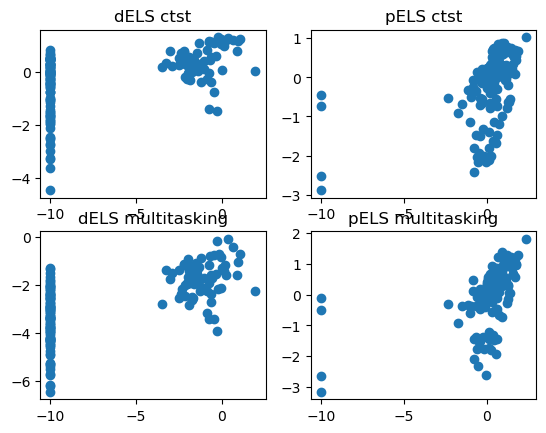

In [11]:
#so the last dELS and pELS are pretty decent, r value around .5, let's plot them
#the indices are
dels_idx = 6
pels_idx = 9
#now plot them
fig, axs = plt.subplots(2,2)
target,out = util_ctst.output_all(dels_idx)
axs[0,0].scatter(target,out, label = 'dels ctst')
#and 11 line
# plt.plot([0,1],[0,1], color = 'black')
target,out = util_ctst.output_all(pels_idx)
axs[0,1].scatter(target,out, label = 'pels ctst')
target,out = util_multitask.output_all(dels_idx)
axs[1,0].scatter(target,out, label = 'dels multitasking')
target,out = util_multitask.output_all(pels_idx)
axs[1,1].scatter(target,out, label = 'pels multitasking')
#and titles
axs[0,0].set_title('dELS ctst')
axs[0,1].set_title('pELS ctst')
axs[1,0].set_title('dELS multitasking')
axs[1,1].set_title('pELS multitasking')



In [14]:
#the results seem fine for the most part, in general this model doesn't seem that stellar...
#but it's fine, let's load in ISM and plot it
import numpy as np
ismpels_ctst = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_ctst{pels_idx}.npy')
ismpels_multitask = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_allcelltypes{pels_idx}.npy')
ismdels_ctst = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_ctst{dels_idx}.npy')
ismdels_multitask = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_allcelltypes{dels_idx}.npy')

In [15]:
#print all shapes
print(ismpels_ctst.shape, ismpels_multitask.shape, ismdels_ctst.shape, ismdels_multitask.shape)

(4, 1024, 161) (4, 1023, 161) (4, 1024, 161) (4, 1023, 161)


In [16]:
#looks about right, now do the plotting
utils_list = [util_ctst, util_multitask]
name_list = ['cell type specific token', 'multitasking']
results_dels = [ismdels_ctst, ismdels_multitask]
results_pels = [ismpels_ctst, ismpels_multitask]

In [17]:
from shap_analysis.ism_utils import *

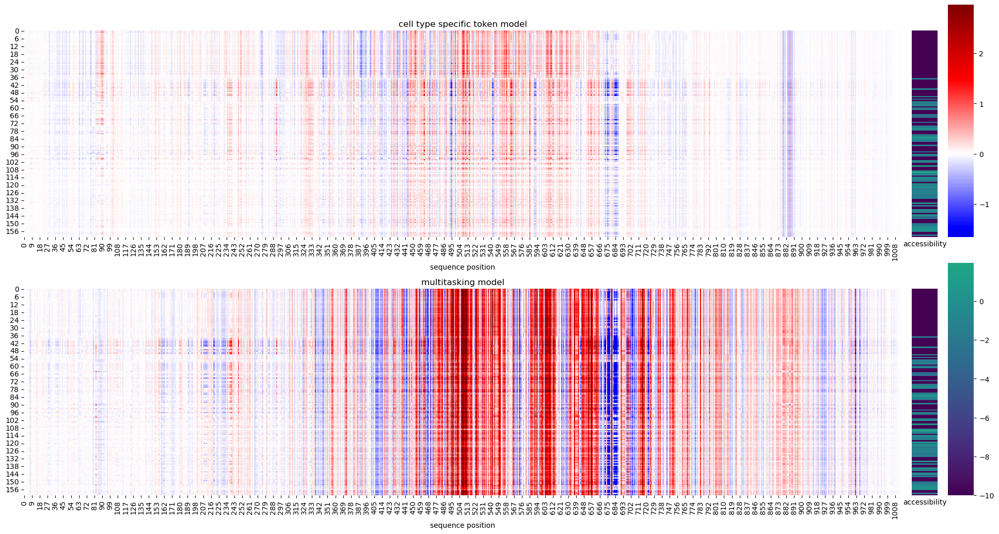

In [18]:
true_values = util_multitask.dataset[dels_idx][1] #for now let's only focus on the dels
multi_ism(results_dels,true_values,name_list,utils_list)

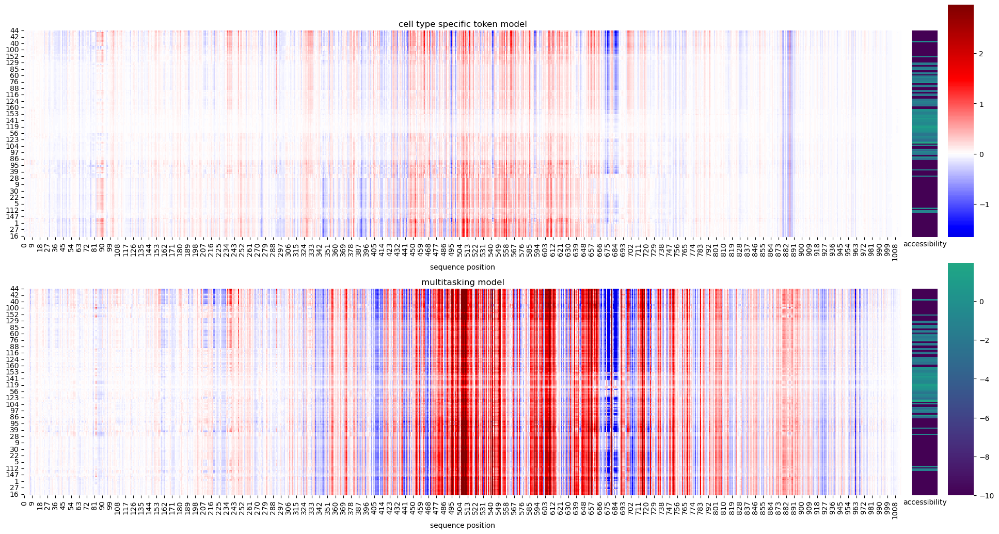

In [20]:
#let's cluster it
multi_cluster(results_dels,true_values, name_list,utils_list)
#that region 648 to 693 is one that seems to really differ across cell types, that whole middle band tho is relatively unchanged
#less the case in multitasking
#let's also look at 80 to 120
#and 288-306
#873 to 900 is interesting because it actually doens't change at all

In [21]:
#first get the list of celltypes
celltypesfile = '/data/leslie/sarthak/data/cCRE_celltype_matrices/cell_types_filtered.txt'
#now load in the celltypes
celltypes = []
with open(celltypesfile) as f:
    for line in f:
        celltypes.append(line.strip())
celltypes

['8988T',
 'chorion_tissue',
 'COLO829',
 'GM03348',
 'AG08395',
 'AG08396',
 'AG20443',
 'germinal_center_tissue',
 'H54',
 'GM10248',
 'GM10266',
 'GM12891',
 'GM12892',
 'GM13976',
 'GM13977',
 'GM18507',
 'GM19238',
 'GM19239',
 'GM19240',
 'GM20000',
 'HEK293T',
 'hepatocyte',
 'HPDE6-E6E7',
 'HTR-8/SVneo',
 'HuH-7',
 'endothelial_cell_of_umbilical_vein_newborn',
 'CWRU1',
 'LNCaP_clone_FGC',
 'MCF-7',
 'D721Med',
 'D341Med',
 'epidermal_melanocyte',
 'C803',
 'osteoblast',
 'RWPE1',
 'SK-N-SH',
 'urothelium_cell_line',
 'A549',
 'AG04449',
 'AG04450',
 'AG09309',
 'AG09319',
 'AG10803',
 'fibroblast_of_the_aortic_adventitia_female',
 'BJ',
 'HS-27A',
 'HS-5',
 'stromal_cell_of_bone_marrow_male',
 'CMK',
 'GM04503',
 'GM04504',
 'GM06990',
 'GM12864',
 'GM12865',
 'GM12878',
 'H1',
 'H7',
 'amniotic_epithelial_cell',
 'brain_pericyte',
 'smooth_muscle_cell_of_the_brain_vasculature_female',
 'cardiac_fibroblast',
 'cardiac_muscle_cell',
 'fibroblast_of_the_conjunctiva',
 'choroid_p

(<Figure size 2000x600 with 2 Axes>,
 array([<Axes: title={'center': '8988T'}>,
        <Axes: title={'center': 'AG10803'}>], dtype=object))

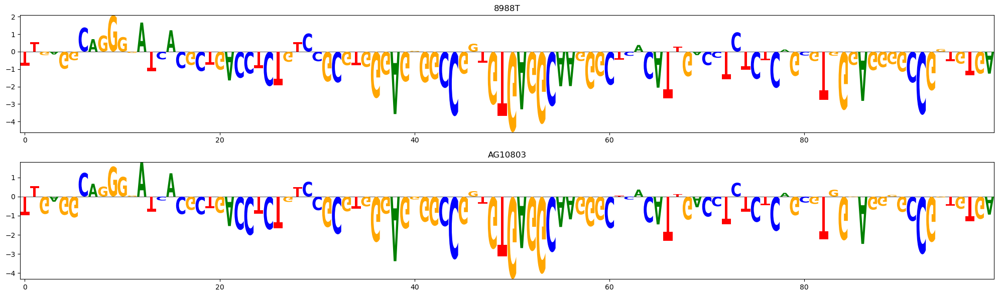

In [45]:
#now let's make a logo plot, will show 10 specific cell types
#we can create a function, then we choose indices, it returns the plots of those cell types and then we can easily put the name of the cell type and the logo plot
#it's just using results list of that index, pretty straightforward!!

def celltype_logo(utils, ccre, celltype_idx, heights_all, startend=None):
    # utils is the single utility for the one we want
    # ccre is the ccre number of that split
    # startend is the start and end of the sequence, if none, will use the middle 100. Note that it adjusts DNase and DNase_ctst slightly, it aligns to the multitasking model!
    # heights_all is basically just the saved array of ISM values or can be something else
    fig, ax = plt.subplots(len(celltype_idx),1, figsize = (20,len(celltype_idx)*3))
    celltypesfile = '/data/leslie/sarthak/data/cCRE_celltype_matrices/cell_types_filtered.txt'
    #now load in the celltypes
    celltypes = []
    with open(celltypesfile) as f:
        for line in f:
            celltypes.append(line.strip())
    # celltypes
    # tempccre = ccre
    for j,i in enumerate(celltype_idx):
        #what we do is first get the sequence
        if utils.mtype == 'DNase' or utils.mtype == 'DNase_ctst':
            tempccre = 161*ccre
        else:
            tempccre = ccre
        a,_ = utils.dataset[tempccre]
        #now we will check to see if it's none, if so we will use the middle
        if startend is None:
            start = utils.middle-50
            end = utils.middle+50
        else:
            start = startend[0]
            end = startend[1]

        if utils.mtype == 'DNase':
            start = start+4
            end = end+4
        try:
            seq=utils.dataset.tokenizer.decode(a)
        except:
            seq=utils.dataset.tokenizer.decode(a[1:])
        cut_seq = seq[start:end]
        #in this function heights is required, generally just the results used for ism

        #now we define cut heights
        heights = heights_all[start:end,i] #will be a matrix of values, we take just the row of the provided celltype_idx
        if True:
            heights = -heights
        logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)
        # print(heights)

        # Fill the DataFrame with heights, converting heights to float if necessary
        
        for k, symbol in enumerate(cut_seq):
            logo_df.loc[k, symbol] = heights[k]

        # Generate the sequence logo
        logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, ax = ax.flatten()[j])
        #now set the title
        ax.flatten()[j].set_title(f'{celltypes[i]}')
        # ax.flatten()[j].set_xlim(start, end)
    plt.tight_layout()
    return fig, ax
idxs = [0,42    ]
celltype_logo(util_multitask, dels_idx, idxs, ismdels_multitask.sum(axis=0))

In [29]:
ismdels_multitask.shape

(4, 1023, 161)

In [31]:
ismdels_multitask.sum(axis=0).shape.T

(1023, 161)

In [60]:
##zoom in on the ctst model
temp = ismdels_ctst.sum(axis=0)
print(temp.shape)

(1024, 161)


<Axes: >

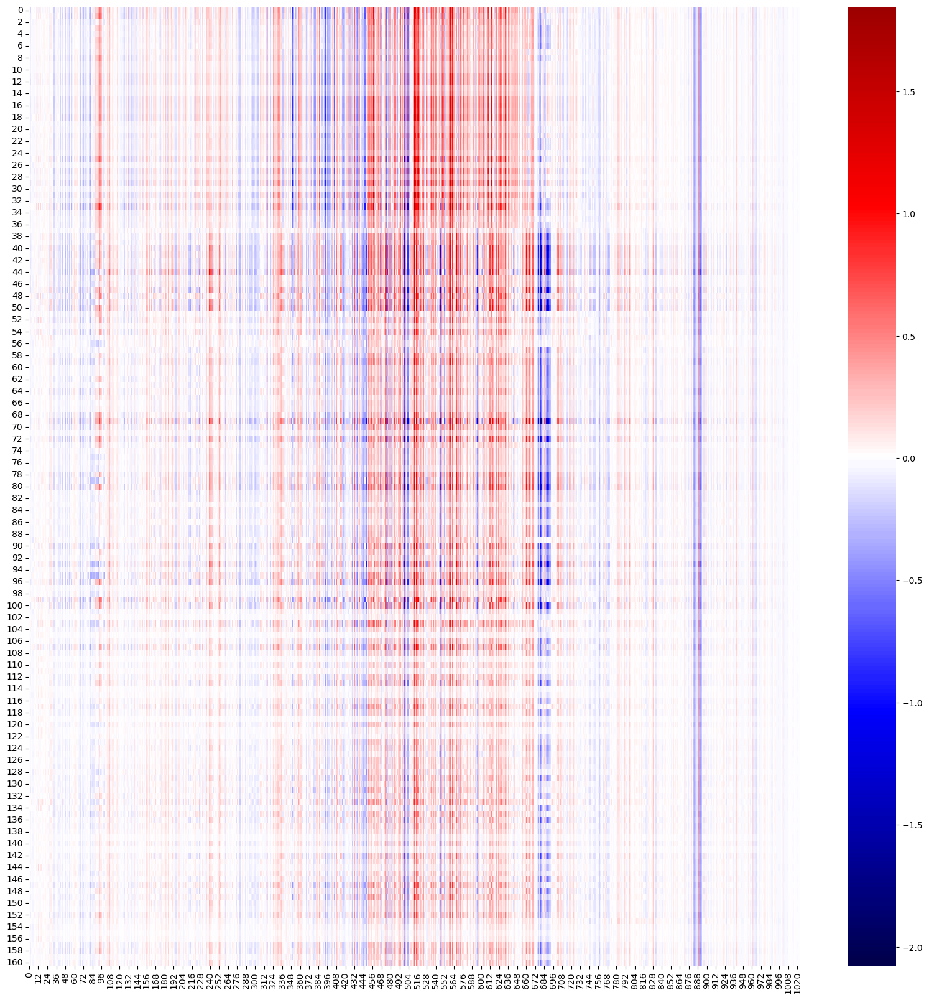

In [67]:
import seaborn as sns
#create 20x20 figure
fig, ax = plt.subplots(1,1, figsize = (20,20))
sns.heatmap(temp.T, cmap = 'seismic', center=0, ax=ax)

In [71]:
#let's find the fibroblasts in celltypes
idx_list = []
for i in range(len(celltypes)):
    if 'fibroblast' in celltypes[i]:
        idx_list.append(i)
idx_list.extend([121,56,114])

In [72]:
for i in (idx_list):
    print(celltypes[i], i)

fibroblast_of_the_aortic_adventitia_female 43
cardiac_fibroblast 60
fibroblast_of_the_conjunctiva 62
fibroblast_of_gingiva 66
fibroblast_of_mammary_gland_female 69
fibroblast_of_pulmonary_artery 74
fibroblast_of_peridontal_ligament_male 75
fibroblast_of_lung 76
fibroblast_of_villous_mesenchyme 82
fibroblast_of_dermis_female_adult 88
H9 121
H7 56
WERI-Rb-1 114


(<Figure size 2000x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': '8988T'}>,
        <Axes: title={'center': 'G401'}>], dtype=object))

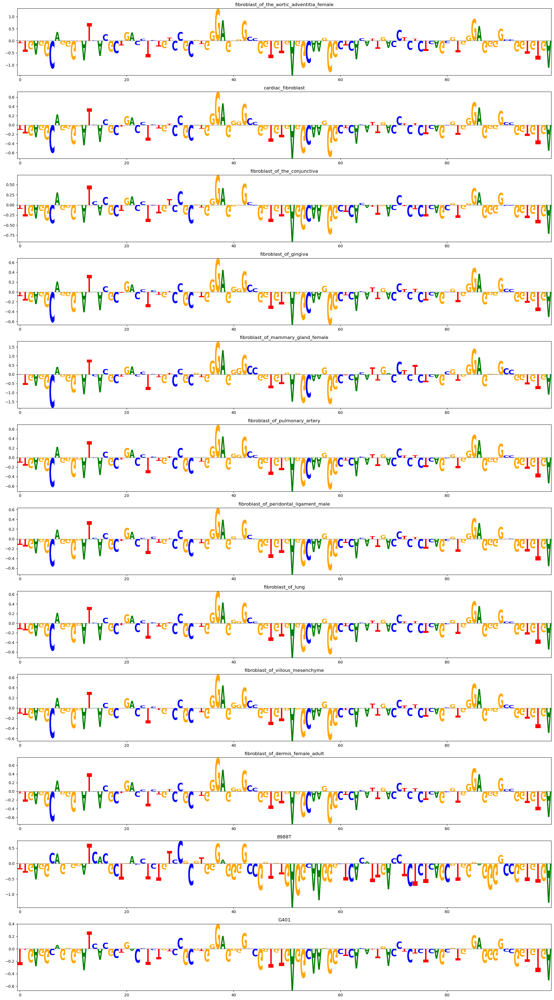

In [46]:
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0))

(<Figure size 2000x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': '8988T'}>,
        <Axes: title={'center': 'G401'}>], dtype=object))

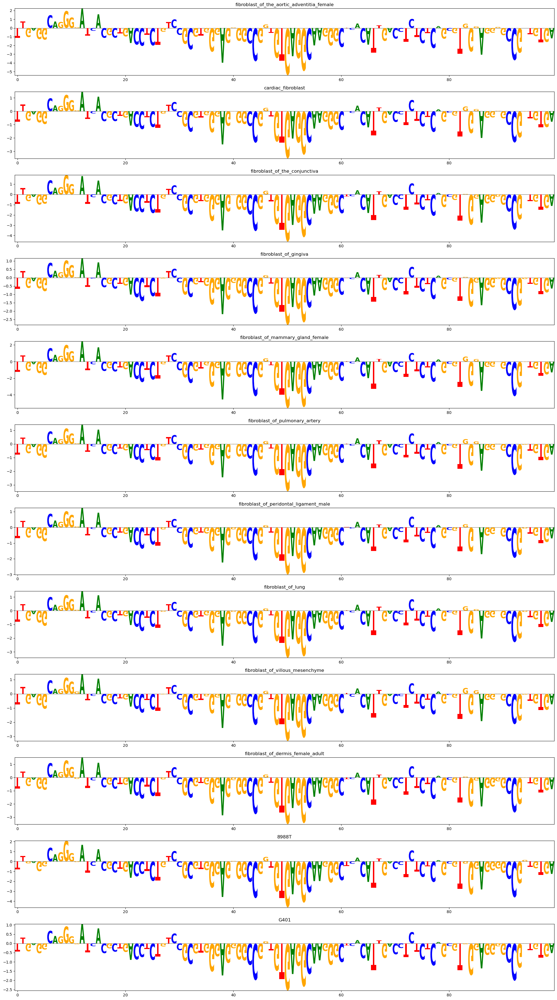

In [47]:
#and the next plot
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0))

(<Figure size 1500x600 with 2 Axes>,
 array([<Axes: title={'center': '8988T'}>,
        <Axes: title={'center': 'AG10803'}>], dtype=object))

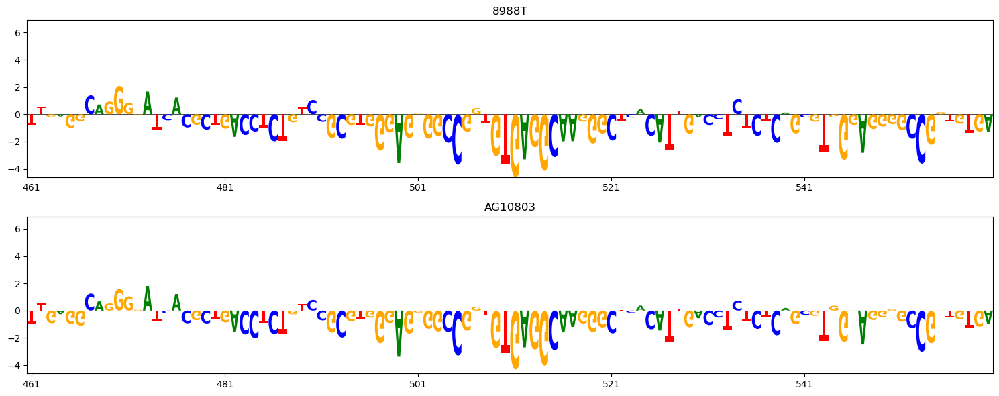

In [77]:
#repeat these plots, but now look at a relevant start/end and also 

#now let's make a logo plot, will show 10 specific cell types
#we can create a function, then we choose indices, it returns the plots of those cell types and then we can easily put the name of the cell type and the logo plot
#it's just using results list of that index, pretty straightforward!!

def celltype_logo(utils, ccre, celltype_idx, heights_all, startend=None):
    # utils is the single utility for the one we want
    # ccre is the ccre number of that split
    # startend is the start and end of the sequence, if none, will use the middle 100. Note that it adjusts DNase and DNase_ctst slightly, it aligns to the multitasking model!
    # heights_all is basically just the saved array of ISM values or can be something else
    fig, ax = plt.subplots(len(celltype_idx),1, figsize = (15,len(celltype_idx)*3))
    celltypesfile = '/data/leslie/sarthak/data/cCRE_celltype_matrices/cell_types_filtered.txt'
    #now load in the celltypes
    celltypes = []
    with open(celltypesfile) as f:
        for line in f:
            celltypes.append(line.strip())
    #first find global min and max
    global_min = np.min(heights_all)
    global_max = np.max(heights_all)
    # for j,i in enumerate(celltype_idx):
    #     heights=heights_all[start:end,i]
    # celltypes
    # tempccre = ccre
    for j,i in enumerate(celltype_idx):
        #what we do is first get the sequence
        if utils.mtype == 'DNase' or utils.mtype == 'DNase_ctst':
            tempccre = 161*ccre
        else:
            tempccre = ccre
        a,_ = utils.dataset[tempccre]
        #now we will check to see if it's none, if so we will use the middle
        if startend is None:
            start = utils.middle-50
            end = utils.middle+50
        else:
            start = startend[0]
            end = startend[1]

        if utils.mtype == 'DNase':
            start = start+4
            end = end+4
        try:
            seq=utils.dataset.tokenizer.decode(a)
        except:
            seq=utils.dataset.tokenizer.decode(a[1:])
        cut_seq = seq[start:end]
        #in this function heights is required, generally just the results used for ism

        #now we define cut heights
        heights = heights_all[start:end,i] #will be a matrix of values, we take just the row of the provided celltype_idx
        if True:
            heights = -heights
        logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)
        # print(heights)

        # Fill the DataFrame with heights, converting heights to float if necessary
        
        for k, symbol in enumerate(cut_seq):
            logo_df.loc[k, symbol] = heights[k]

        # Generate the sequence logo
        logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, ax = ax.flatten()[j])
        #now set the title
        ax.flatten()[j].set_title(f'{celltypes[i]}')
        #now set the x ticks to be at 0,20,...100
        # print(start-end)
        ax.flatten()[j].set_xticks(np.arange(0,end-start,int((end-start)/5)))
        #now set the labels to be based on start and end
        ax.flatten()[j].set_xticklabels(np.arange(start,end,int((end-start)/5)))
        # ax.flatten()[j].set_xlim(start, end)
        ax.flatten()[j].set_ylim(global_min,global_max)
    plt.tight_layout()
    return fig, ax
idxs = [0,42]
celltype_logo(util_multitask, dels_idx, idxs, ismdels_multitask.sum(axis=0))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

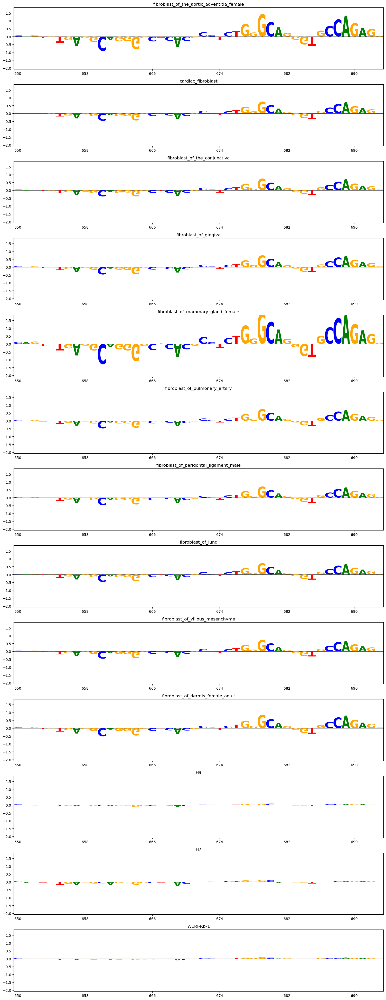

In [86]:
#now we make our proper figure with this approach
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(650,694))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

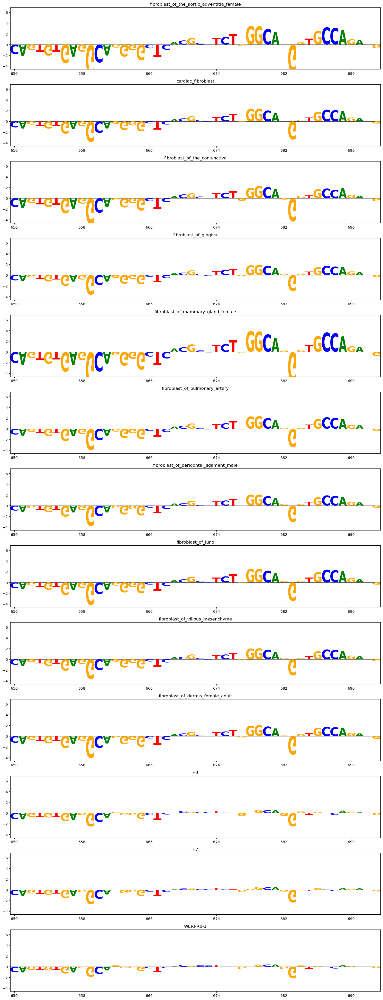

In [87]:
#and multitasking
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(650,694))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

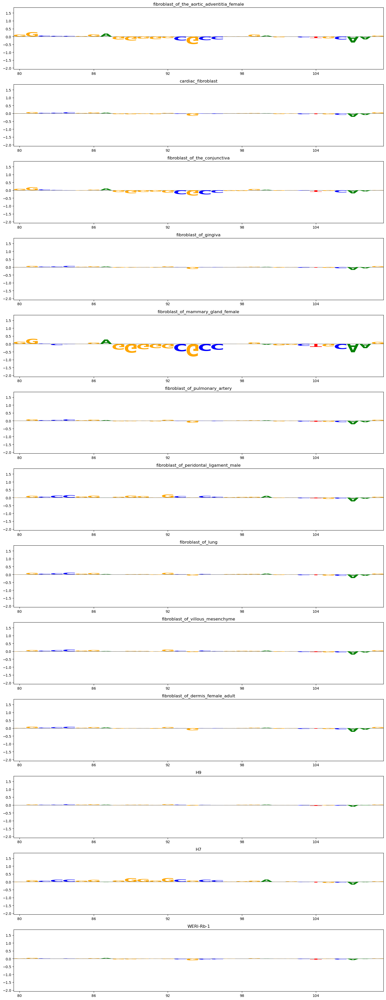

In [80]:
#let's look at th enext start and end region
#80 to 110
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(80,110))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

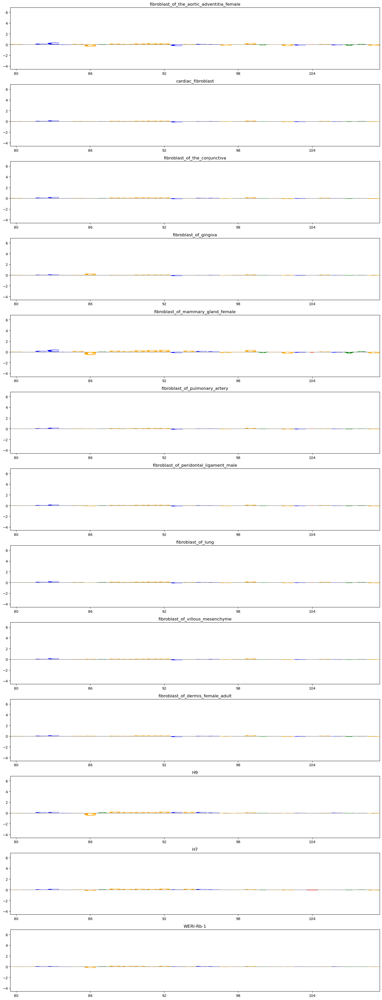

In [81]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(80,110))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

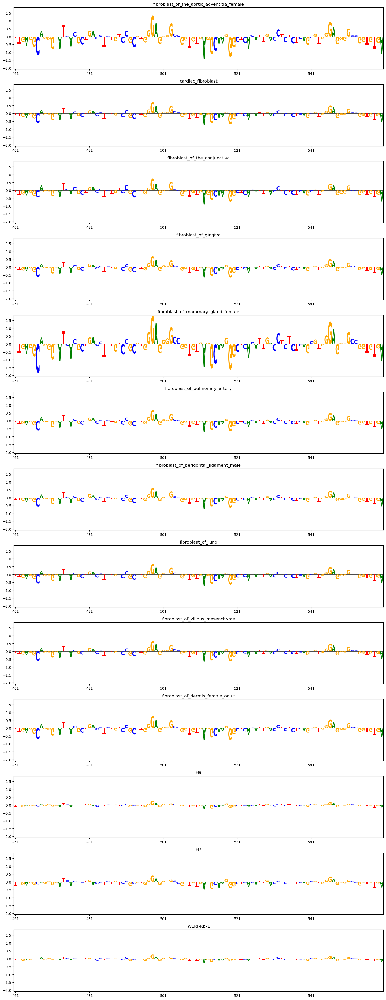

In [82]:
#just look at the middle section (don't give it a start and end)
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

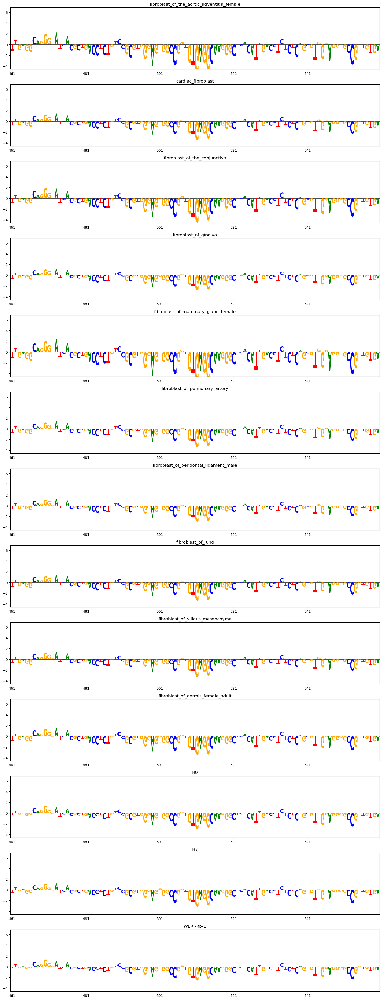

In [83]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

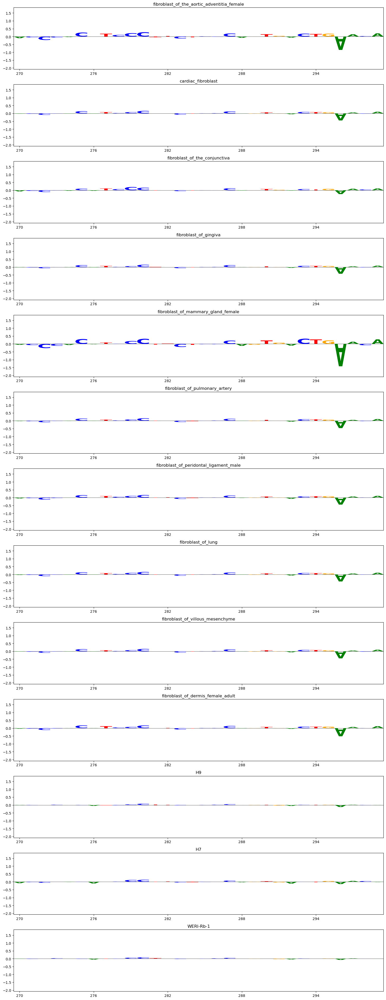

In [88]:
#let's try a few more, then more onto pels
#let's do 270-300
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(270,300))

(<Figure size 1500x3900 with 13 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female'}>,
        <Axes: title={'center': 'cardiac_fibroblast'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male'}>,
        <Axes: title={'center': 'fibroblast_of_lung'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult'}>,
        <Axes: title={'center': 'H9'}>, <Axes: title={'center': 'H7'}>,
        <Axes: title={'center': 'WERI-Rb-1'}>], dtype=object))

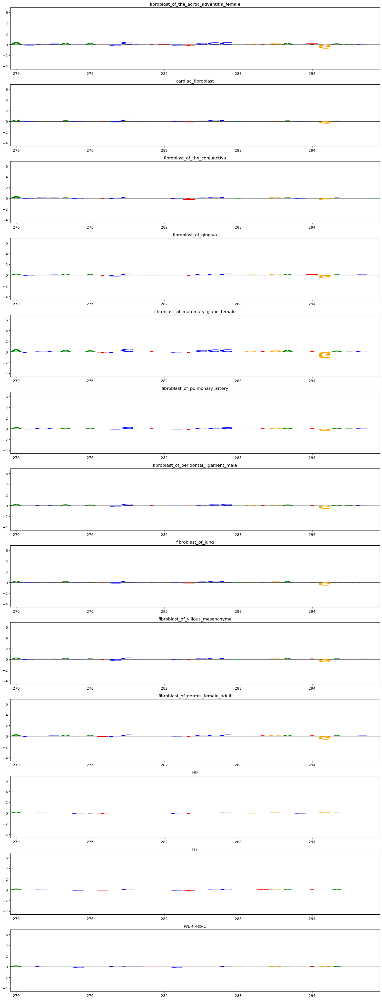

In [89]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(270,300))

# the pels now

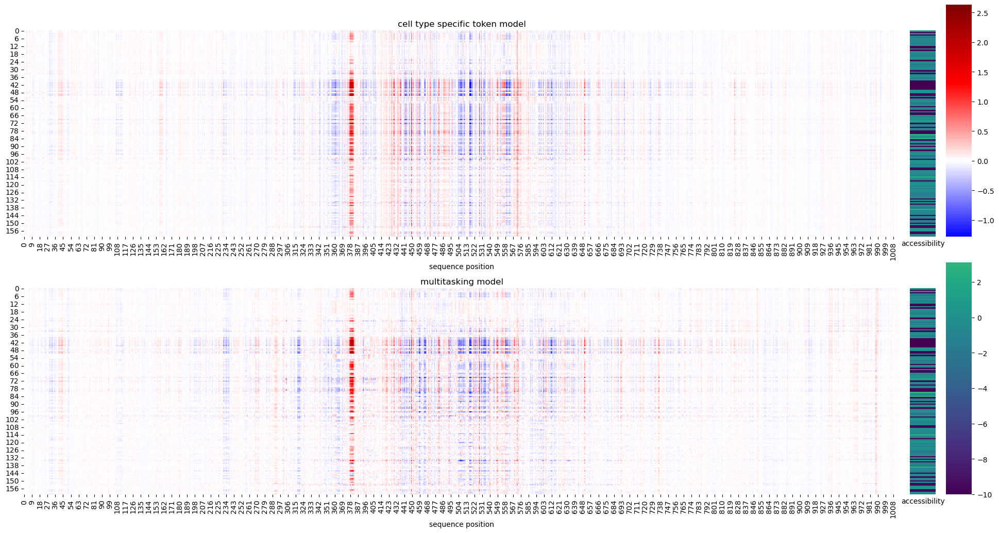

In [98]:
#the same as before but for the pels, first t he multi ism
true_values = util_multitask.dataset[22][1] #for now let's only focus on the dels
dels_idx = 22 #we are now doing it with this new idx
ismdels_ctst = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_ctst{dels_idx}.npy')
ismdels_multitask = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_allcelltypes{dels_idx}.npy')
results_dels = [ismdels_ctst, ismdels_multitask]
multi_ism(results_dels,true_values,name_list,utils_list)

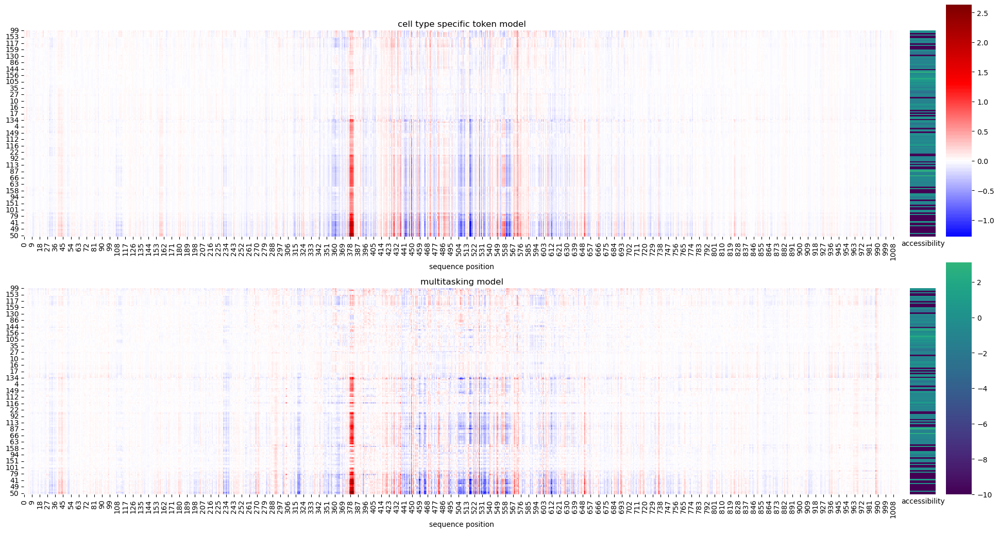

In [99]:
#and cluster
multi_cluster(results_dels,true_values, name_list,utils_list)

In [103]:
for i in range(100):
    print(a:=util_ctst.find_ccre_type(i))
    # print(util_ctst.find_ccre_type(i))
    if 'dELS' not in a:
        continue
    target,out = util_ctst.output_all(i)
    #now calculate the correlation value
    print(i, pearsonr(target,out))

CTCF-only,CTCF-bound
pELS,CTCF-bound
DNase-H3K4me3,CTCF-bound
CTCF-only,CTCF-bound
CTCF-only,CTCF-bound
dELS
predicted output mean: 1.7180434724558955, actual output mean: -1.0747907244157833
5 PearsonRResult(statistic=0.2100272252172513, pvalue=0.007493559600188333)
dELS
predicted output mean: -0.160890555029492, actual output mean: -6.255941401033298
6 PearsonRResult(statistic=0.49400667271904886, pvalue=2.750242941079166e-11)
PLS,CTCF-bound
PLS,CTCF-bound
pELS,CTCF-bound
pELS
pELS,CTCF-bound
PLS
pELS,CTCF-bound
pELS,CTCF-bound
pELS
pELS
pELS
pELS,CTCF-bound
pELS,CTCF-bound
PLS,CTCF-bound
dELS
predicted output mean: -0.2555628359008303, actual output mean: -1.8366019428239106
21 PearsonRResult(statistic=0.49462523196754, pvalue=2.5757973041407097e-11)
dELS
predicted output mean: -0.1336661549661054, actual output mean: -3.2201260563842258
22 PearsonRResult(statistic=0.4485455283442924, pvalue=2.4140741909490065e-09)
dELS,CTCF-bound
predicted output mean: -0.14725047276176004, actual 

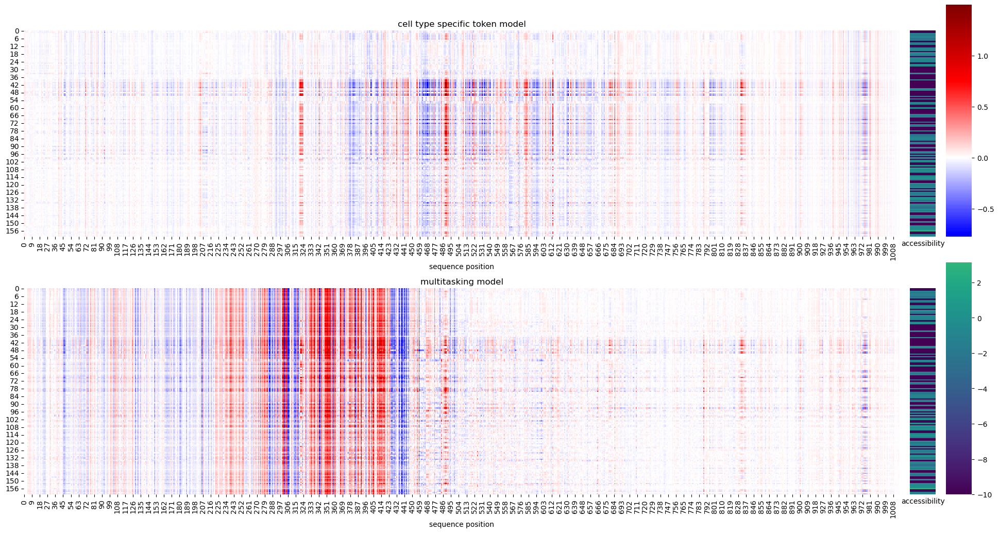

In [116]:
#let's try 35 and 65 and 69, 76
dels_idx = 28
#the same as before but for the pels, first t he multi ism
true_values = util_multitask.dataset[dels_idx][1] #for now let's only focus on the dels
 #we are now doing it with this new idx
ismdels_ctst = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_ctst{dels_idx}.npy')
ismdels_multitask = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_allcelltypes{dels_idx}.npy')
results_dels = [ismdels_ctst, ismdels_multitask]
multi_ism(results_dels,true_values,name_list,utils_list)

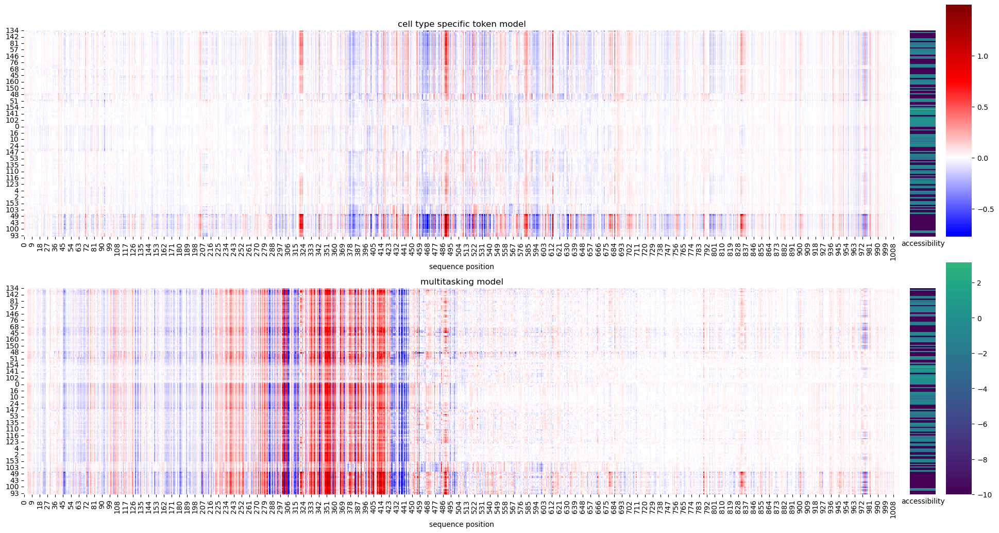

In [117]:
multi_cluster(results_dels,true_values, name_list,utils_list)

In [118]:
#multitasking actually seems more cts, but maybe that's a bad thing? idk about this one in general...
#295-335 is cool
#middle area also interesting

#repeat these plots, but now look at a relevant start/end and also 

#now let's make a logo plot, will show 10 specific cell types
#we can create a function, then we choose indices, it returns the plots of those cell types and then we can easily put the name of the cell type and the logo plot
#it's just using results list of that index, pretty straightforward!!

def celltype_logo(utils, ccre, celltype_idx, heights_all, startend=None):
    # utils is the single utility for the one we want
    # ccre is the ccre number of that split
    # startend is the start and end of the sequence, if none, will use the middle 100. Note that it adjusts DNase and DNase_ctst slightly, it aligns to the multitasking model!
    # heights_all is basically just the saved array of ISM values or can be something else
    fig, ax = plt.subplots(len(celltype_idx),1, figsize = (15,len(celltype_idx)*3))
    celltypesfile = '/data/leslie/sarthak/data/cCRE_celltype_matrices/cell_types_filtered.txt'
    #now load in the celltypes
    celltypes = []
    with open(celltypesfile) as f:
        for line in f:
            celltypes.append(line.strip())
    #first find global min and max
    global_min = np.min(heights_all)
    global_max = np.max(heights_all)
    # for j,i in enumerate(celltype_idx):
    #     heights=heights_all[start:end,i]
    # celltypes
    # tempccre = ccre
    for j,i in enumerate(celltype_idx):
        #what we do is first get the sequence
        if utils.mtype == 'DNase' or utils.mtype == 'DNase_ctst':
            tempccre = 161*ccre
        else:
            tempccre = ccre
        a,_ = utils.dataset[tempccre]
        #now we will check to see if it's none, if so we will use the middle
        if startend is None:
            start = utils.middle-50
            end = utils.middle+50
        else:
            start = startend[0]
            end = startend[1]

        if utils.mtype == 'DNase':
            start = start+4
            end = end+4
        try:
            seq=utils.dataset.tokenizer.decode(a)
        except:
            seq=utils.dataset.tokenizer.decode(a[1:])
        cut_seq = seq[start:end]
        #in this function heights is required, generally just the results used for ism

        #now we define cut heights
        heights = heights_all[start:end,i] #will be a matrix of values, we take just the row of the provided celltype_idx
        if True:
            heights = -heights
        logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)
        # print(heights)

        # Fill the DataFrame with heights, converting heights to float if necessary
        
        for k, symbol in enumerate(cut_seq):
            logo_df.loc[k, symbol] = heights[k]

        # Generate the sequence logo
        logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, ax = ax.flatten()[j])
        #now set the title
        ax.flatten()[j].set_title(f'{celltypes[i]}, true={true_values[i]}')
        #now set the x ticks to be at 0,20,...100
        # print(start-end)
        ax.flatten()[j].set_xticks(np.arange(0,end-start,int((end-start)/5)))
        #now set the labels to be based on start and end
        ax.flatten()[j].set_xticklabels(np.arange(start,end,int((end-start)/5)))
        # ax.flatten()[j].set_xlim(start, end)
        ax.flatten()[j].set_ylim(global_min,global_max)
    plt.tight_layout()
    return fig, ax

In [119]:
#let's remake the celltype list
idx_list = []
for i in range(len(celltypes)):
    if 'fibroblast' in celltypes[i]:
        idx_list.append(i)
idx_list.extend([12,154])

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

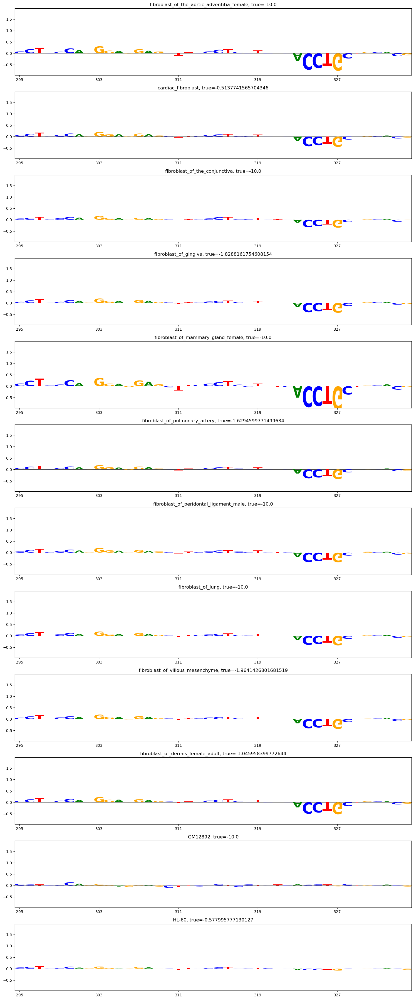

In [120]:
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(295,335))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

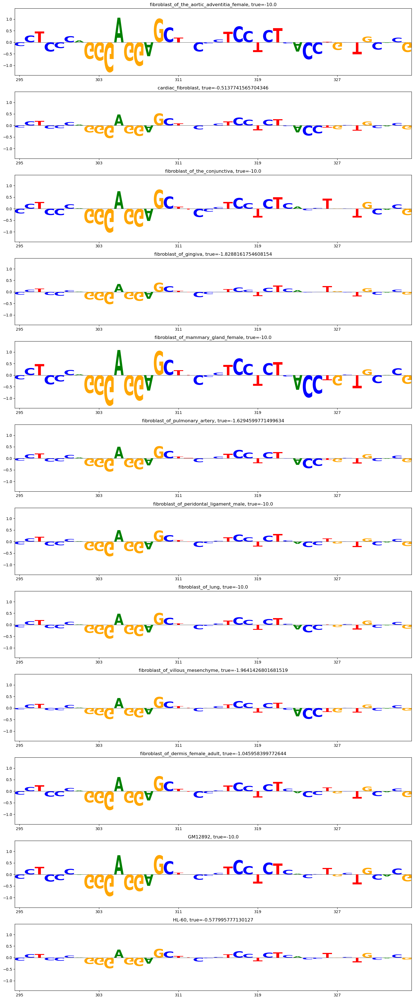

In [121]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(295,335))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

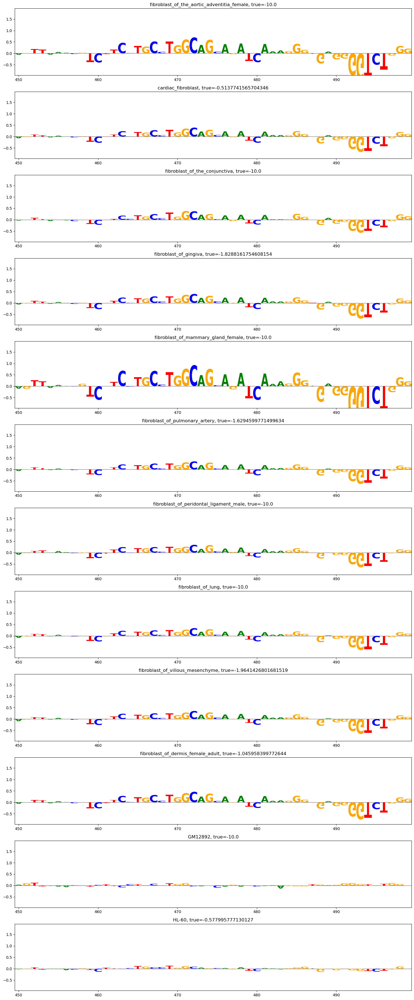

In [122]:
#now 450 to 500
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(450,500))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

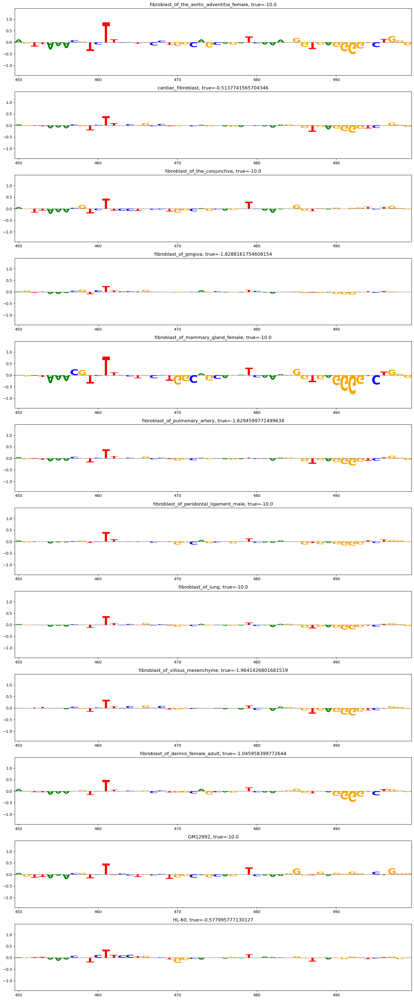

In [123]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(450,500))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

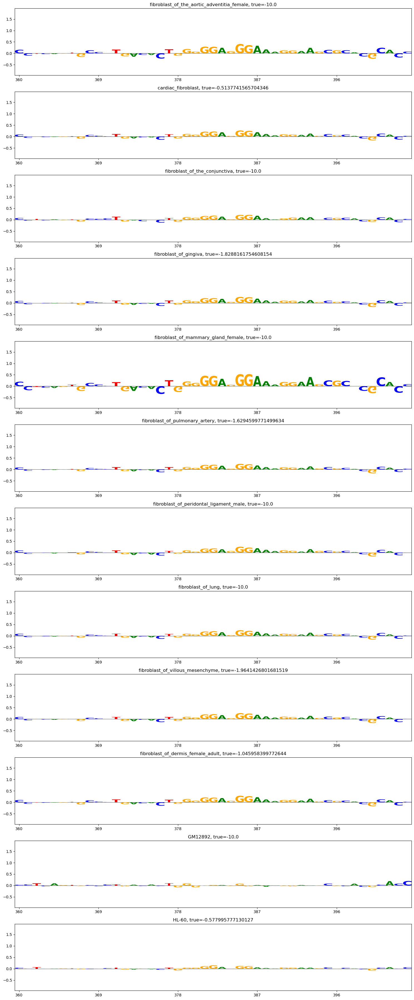

In [124]:
#finally 360-405
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(360,405))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

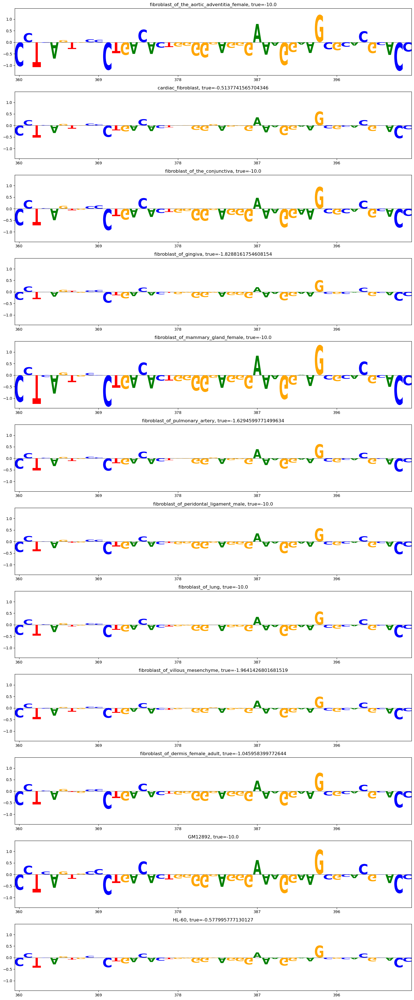

In [125]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(360,405))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

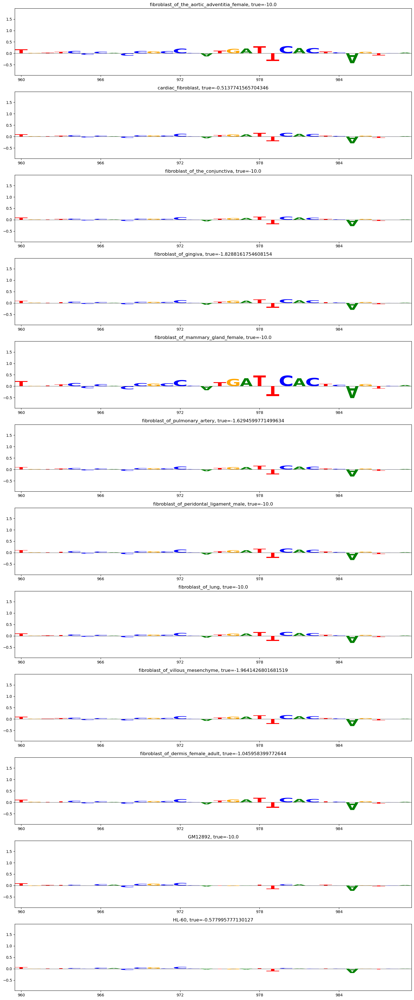

In [126]:
#finally 960-990
celltype_logo(util_ctst,dels_idx,idx_list,ismdels_ctst.sum(axis=0), startend=(960,990))

(<Figure size 1500x3600 with 12 Axes>,
 array([<Axes: title={'center': 'fibroblast_of_the_aortic_adventitia_female, true=-10.0'}>,
        <Axes: title={'center': 'cardiac_fibroblast, true=-0.5137741565704346'}>,
        <Axes: title={'center': 'fibroblast_of_the_conjunctiva, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_gingiva, true=-1.8288161754608154'}>,
        <Axes: title={'center': 'fibroblast_of_mammary_gland_female, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_pulmonary_artery, true=-1.6294599771499634'}>,
        <Axes: title={'center': 'fibroblast_of_peridontal_ligament_male, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_lung, true=-10.0'}>,
        <Axes: title={'center': 'fibroblast_of_villous_mesenchyme, true=-1.9641426801681519'}>,
        <Axes: title={'center': 'fibroblast_of_dermis_female_adult, true=-1.045958399772644'}>,
        <Axes: title={'center': 'GM12892, true=-10.0'}>,
        <Axes: title={'center': 'HL-60, 

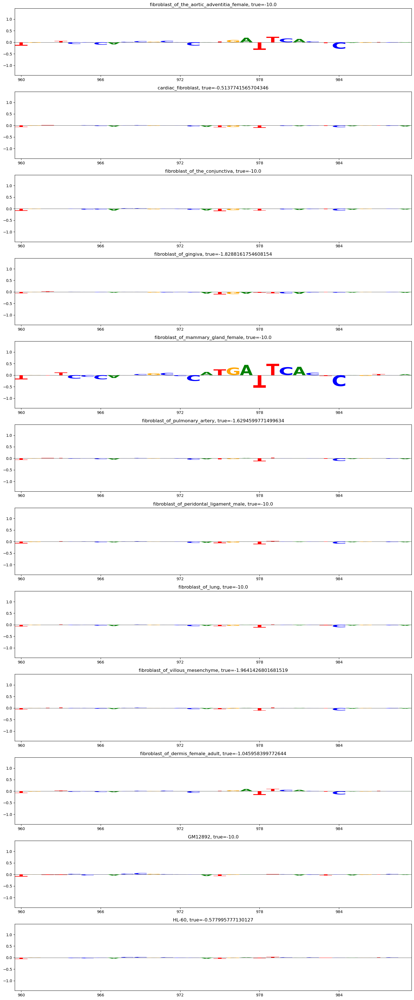

In [127]:
celltype_logo(util_multitask, dels_idx, idx_list, ismdels_multitask.sum(axis=0), startend=(960,990))

# final step: adjust ISM utils to work with the classification model
Similar framework to how we did it with the evaluation utils, can look at that and see

In [26]:
import torch 
import sys
import yaml 
sys.path.append('/data/leslie/sarthak/hyena/hyena-dna/')
from src.tasks.decoders import SequenceDecoder
from src.models.sequence.dna_embedding import DNAEmbeddingModel
from src.dataloaders.datasets.hg38_char_tokenizer import CharacterTokenizer
# import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import logomaker
from tqdm import tqdm
class ISMUtils():
    def __init__(self, model_type, ckpt_path, cfg = None, split = 'train', filter=True, classification = False):
        type_list = ['ccre', 'DNase_ctst', 'DNase_allcelltypes', 'DNase']
        if model_type not in type_list:
            raise ValueError('Model type not recognized')
        self.mtype = model_type
        if cfg is not None:
            cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/'+cfg
        self.classification = classification
        
        #check to see the type, and then load the right tokenizer, class and cfg
        if self.mtype == 'DNase':
            from src.dataloaders.datasets.DNase_dataset import DNaseDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N', 'S', 'U', 'V', 'W', 'X', 'Y', 'Z'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase.yaml'
                
        elif self.mtype == 'DNase_allcelltypes':
            from src.dataloaders.datasets.DNase_allcelltypes import DNaseAllCellTypeDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes.yaml'
                 

        elif self.mtype == 'DNase_ctst':
            from src.dataloaders.datasets.DNase_ctst_dataset import DNaseCtstDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst.yaml'

        else:
            raise ValueError('Model type not recognized')

        #now we load the model and dataset

        # self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.dataset = DatasetClass(max_length = 1024, split = split, tokenizer=self.tokenizer, rc_aug = False, tokenizer_name='char', add_eos='True', filter = filter, classification=self.classification)
        cfg = yaml.load(open(cfg, 'r'), Loader=yaml.FullLoader)
        
        train_cfg = cfg['train']  # grab section `train` section of config
        model_cfg = cfg['model_config']  # grab the `model` section of config
        d_output = train_cfg['d_output']
        backbone = DNAEmbeddingModel(**model_cfg)
        # backbone_skip = DNAEmbeddingModel(skip_embedding=True, **model_cfg)
        decoder = SequenceDecoder(model_cfg['d_model'], d_output=d_output, l_output=0, mode='pool')
        state_dict = torch.load(ckpt_path, map_location='cpu')  # has both backbone and decoder
        
        # loads model from ddp by removing prexix to single if necessary
        torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(
            state_dict["state_dict"], "model."
        )

        model_state_dict = state_dict["state_dict"]

        # need to remove torchmetrics. to remove keys, need to convert to list first
        for key in list(model_state_dict.keys()):
            if "torchmetrics" in key:
                model_state_dict.pop(key)

        # the state_dict keys slightly mismatch from Lightning..., so we fix it here
        decoder_state_dict = {}
        decoder_state_dict['output_transform.weight'] = model_state_dict.pop('decoder.0.output_transform.weight')
        decoder_state_dict['output_transform.bias'] = model_state_dict.pop('decoder.0.output_transform.bias')

        #now adjust the backbone if needed
        if self.mtype == 'DNase':
            embedding1 = torch.nn.Embedding(20, 128)
            # embedding2 = torch.nn.Embedding(20, 128)
            backbone.backbone.embeddings.word_embeddings = embedding1 #again a hack
            # backbone_skip.backbone.embeddings.word_embeddings = embedding2 #again a hack

        # now actually load the state dict to the decoder and backbone separately
        decoder.load_state_dict(decoder_state_dict, strict=True)
        backbone.load_state_dict(model_state_dict, strict=True)

        self.backbone = backbone.eval()
        self.decoder = decoder.eval()

        self.bed = pd.read_csv('/data/leslie/sarthak/data/GRCh38-cCREs.bed', header=None, delimiter='\t').to_numpy()
        self.middle = 1023//2 #just used for the logo plots

    def calculate_ISM(self,ccre, cuda = False, return_out = False, progress_bar = False):
        #does ISM for that ccre, based on the model type
        #Does what the ISM.py and ISM_allcelltypes.py files do but for one ccre at a time
        #ccre should be the index of the ccre, not the index to get that dataset
        device = "cuda:0" if cuda else "cpu"
        backbone = self.backbone.to(device)
        decoder = self.decoder.to(device)
        #first have to load in the batch
        #if it's the different groups have very different dataset classes
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
            ccre_list = []
            out_list = []
            class_list = []
            for i in range(161):
                a,b = self.dataset[ccre+i]
                ccre_list.append(a)
                if self.classification:
                    # raise NotImplementedError('This is not implemented yet, need to consider how to do ISM with the classification model')
                    b = b[1] #just ignore the classification stuff?
                    class_list.append(b[0].item())
                out_list.append(b.item())
            ccre_list = torch.stack(ccre_list)
        else:
            ccre_list = self.dataset[ccre][0].unsqueeze(0)
            class_list = self.dataset[ccre][1][0] #the classification stuff

        temp,_ = backbone(ccre_list.to(device)) #pass whole ccre as a batch
        out = decoder(temp)
        seqlen = ccre_list.shape[1] #because it's batch x seq
        #TODO replace the 1023 and 1024 with some general approach, and find some way to make my code work

        if self.classification:
            out_class = out[:,:out.shape[1]//2]
            out = out[:,out.shape[1]//2:] #just ignore the classification stuff? for now maybe and we just look at the regression outputs?
            #but if it thinks that the thing is closed, we should keep it as 0... or maybe set it to some other value? idk
            #i say keep it but we know that we can mask it, no let's mask for reg, but still need to use for class...
            #and let's keep the class out
            out_class_gt_np = out_class.detach().cpu().numpy().reshape(1,1,161)
            ISM_class = np.ones((4,seqlen,161))*out_class_gt_np

        out_gt_np = out.detach().cpu().numpy().reshape(1, 1, 161) #the initial output of the model before ism
        
        #now we can calculate the ISM
        #we add someway to return the output of the model as well if we want to
        ISM_results = np.ones((4,seqlen,161))*out_gt_np
        # if self.mtype == 'DNase_ctst': #no longer need because not defining the shape manually as 1023 or 1024, just seqlen
            # ISM_results = np.ones((4,seqlen,161))*out_gt_np #because is full 1024 sequence length...
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst': #we just need the first sequence, don't care about the useless stuff
            seq = ccre_list[0]
        else:
            seq = ccre_list.squeeze() #get rid f the embedding dimension
        token_list = [7,8,9,10] #tokenize this list first

        if progress_bar:
            iterator = tqdm(enumerate(seq), total = len(seq))
        else:
            iterator = enumerate(seq)
        with torch.no_grad():
            for idx, nucleotide in iterator: 
                temp_token_list = token_list.copy() #we make a copy
                # print(nucleotide)
                if nucleotide not in temp_token_list:
                    continue #basically skips this and none of it is updated, because is a weird tooken, whether permutation, ctst or something else
                temp_token_list.remove(nucleotide)
                temp_token_list = np.array(temp_token_list)
                #we can now compute a mask if self.classification that masks some values
                if self.classification:
                    mask_idx = np.array(class_list) == 1 #if it's open
                    #now we make this a matrix of the same size as the output which will be 3x1x161 or just 3x161
                    mask = np.zeros((161,1))
                    mask[mask_idx,:] = 1
                else:
                    mask = 1 #if regression just multiply it by 1, does nothign!
                results_list = []
                class_results_list = []
                for j in temp_token_list:
                    temp_seq = ccre_list.clone() #never put on the gpu
                    if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
                        # if self.classification:
                            # temp_seq[mask,idx] = j #so it's still run through the model, but only the ones that are altered??
                            #no, because can't do it for multitasking model...
                        # else:
                        temp_seq[:,idx] = j
                    else:
                        temp_seq[idx] = j
                    a,_ = backbone(temp_seq.to(device))
                    out = decoder(a)
                    if self.classification:
                        #only look at the second half of the output anyways
                        #and also have to consider multiplying by the mask
                        reg_out = out[:,out.shape[1]//2:].detach().cpu().numpy()
                        reg_out = reg_out * mask
                        results_list.append(reg_out.squeeze())
                        class_out = out[:,:out.shape[1]//2]
                        class_results_list.append(class_out.detach().cpu().numpy().squeeze())
                    else:
                        results_list.append(out.detach().cpu().numpy()) #shape will be 161x1 which is fine...
                ISM_results[temp_token_list-7,idx,:] = np.array(results_list).squeeze()
                if self.classification:
                    ISM_class[temp_token_list-7,idx,:] = np.array(class_results_list).squeeze()
                
        #relatively slow on the CPU
        #and now we subtract the out_gt from it
        ISM_results_normalized = ISM_results - out_gt_np #is mutated - reference
        if self.classification:
            ISM_class_normalized = ISM_class - out_class_gt_np
        if self.classification and return_out:
            return ISM_results_normalized, ISM_class_normalized, out_gt_np, out_class_gt_np
        elif self.classification:
            return ISM_results_normalized, ISM_class_normalized 
        elif return_out: #but this is optional
            return ISM_results_normalized, out_gt_np
        return ISM_results_normalized

    def var(self, idx):
        #This is the idx for the ccre, so if you want it for ccre 2 it's just idx == 2. Not 161*idx
        seq_idx = idx
        cCRE_id = self.dataset.array[seq_idx][0] #get the id from the array
        row = self.dataset.cCRE_dict[cCRE_id]
        #now we can calculate the variance using this data
        # print(np.var(dnase_filtered[row,:])) #identical
        
        return np.var(self.dataset.cell_dnase_levels[row,:])

    def output(self,idx):
        #given the index, this finds the associated output (single value)
        #this literally just puts it thorugh the model, but it's like 2 lines of code and really easy to do yourself
        a,b = self.dataset[idx]
        temp,_ = self.backbone(a.unsqueeze(0))
        out = self.decoder(temp)

        if self.mtype == 'DNase':
            print(f'predicted output: {out}, actual output: {b}')
            return b, out

        elif self.mtype == 'DNase_allcelltypes':
            print(f'predicted output: {out[0,0]}, actual output: {b[0]}')
            return b[0], out[0,0]

    def output_all(self,idx, print_out = False):
        #given the index, this finds the associated output (all values averaged across the cell types for a singel ccre)
        #if it's DNase, then we need to do it for all the cell types, here the input idx should not be 161 times any number, rather just the ccre number
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            idx = 161*idx
            out_list = []
            target_list = []
            for i in range(161):
                a,b = self.dataset[idx+i]
                temp,_ = self.backbone(a.unsqueeze(0))
                out = self.decoder(temp)
                out_list.append(out.item())
                if isinstance(b,tuple):
                    raise NotImplementedError('This is not implemented yet, need to consider how to do handle these outputs and what we want to display')
                target_list.append(b.item())
            out = np.mean(out_list)
            if print_out:
                print(f'predicted output mean: {out}, actual output mean: {np.mean(target_list)}')
            #but return the whole lists
            return np.array(target_list), np.array(out_list)

        if self.mtype == 'DNase_allcelltypes':
            a,b = self.dataset[idx]
            temp,_ = self.backbone(a.unsqueeze(0))
            out = self.decoder(temp)
            print(f'predicted output mean: {torch.mean(out)}, actual output mean: {torch.mean(b)}')
            return b.detach().numpy(), out.detach().numpy()

    def plot_singlecelltype(self, data, celltype = 0):
        #given the index, this finds the associated output (single value)
        #we can either take in the actual data, or the ccre number
        #actual data must be formatted the same as the saved data
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray: #you can also just give it the data and then it doesn't need to load it
            data_loaded = data
        fig, ax = plt.subplots(1,1, figsize = (20,10))
        sns.heatmap(data_loaded[:,:,celltype], cmap = 'seismic', center = 0)
        plt.yticks([0.5,1.5,2.5,3.5],['A','C','G','T'])
        plt.xlabel('sequence position')
        plt.title(f'ISM scores for the {celltype} cell type of the {data} ccre')
        plt.show()

    def plot_all(self,data):
        #once again can give the ccre or the actual data
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray:
            data_loaded = data
        fig, ax = plt.subplots(1,1, figsize = (20,10))
        sns.heatmap(data_loaded.sum(axis = 0).T, cmap = 'seismic', center = 0)
        plt.ylabel('celltype')
        plt.xlabel('sequence position')
        plt.title('ISM scores for all cell types single ccre')
        plt.show()

    def default_heights(self,data):
        #it will sum across the nucelotides and average over the celltypes
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray:
            data_loaded = data
        return data_loaded.sum(axis = 0).mean(axis = 1)

    def logoplot(self,ccre,heights = None, startend=None,flip_heights = False): #potentially we add the title as an input into the model
        #so given the ccre number and the heights, this will plot the logo plot
        #note ccre should be the ccre number regardless of the model type
        #heights must be provided, is usually the sum across the axis=1 for the data that is used for plot_all, uses same start and end
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
        a,b = self.dataset[ccre]
        seq=self.dataset.tokenizer.decode(a)
        if startend is None and self.mtype == 'DNase':
            start = self.middle-50+4
            end = self.middle+50+4
        elif startend is None and self.mtype == 'DNase_allcelltypes':
            start = self.middle-50
            end = self.middle+50
        elif self.mtype == 'DNase': #if specify it, add 4 to the dnase, just so aligns with the multitasking model
            start = startend[0]+4
            end = startend[1]+4
        elif self.mtype == 'DNase_ctst':
            start = startend[0]+1
            end = startend[1]+1
        else:
            start = startend[0]
            end = startend[1]

        #now we can define cut_seq
        cut_seq = seq[start:end]
                    
        if heights is None:
            raise ValueError('Need to provide heights')

        #now we define cut heights
        heights = heights[start:end]
        if flip_heights:
            heights = -heights
        logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)

        # Fill the DataFrame with heights, converting heights to float if necessary
        for i, symbol in enumerate(cut_seq):
            logo_df.loc[i, symbol] = heights[i]

        # Generate the sequence logo
        # fig, ax = 
        # fig.set_size_inches(20, 3)  # Set the desired width and height here        
        logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, figsize = (20,3))
        plt.title('Sequence logo')
        # fig.show()
    
    def find_ccre_type(self, idx):
        #this function will use the ccre id to find the specific type
        #uses the index of the dataset, not the cCRE for the DNase model!!
        #first get the id
        if self.mtype == 'DNase':        
            seq_idx = int(idx/self.dataset.cell_types)
        else:
            seq_idx = idx
        ccre_id = self.dataset.array[seq_idx][0]
        line = np.where(self.bed[:,3] == ccre_id)
        return self.bed[line[0][0], -1]


In [27]:
#now test this! We can use return to stop the funciton early and have it make sure we get the proper shapes!
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)

In [35]:
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)

 13%|█▎        | 129/1024 [00:14<01:43,  8.68it/s]

100%|██████████| 1024/1024 [01:58<00:00,  8.61it/s]


In [36]:
len(out)

4

In [37]:
#let's look at class out
reg_out, class_out, reg_true, class_true = out
print(reg_out.shape,class_out.shape)

(4, 1024, 161) (4, 1024, 161)


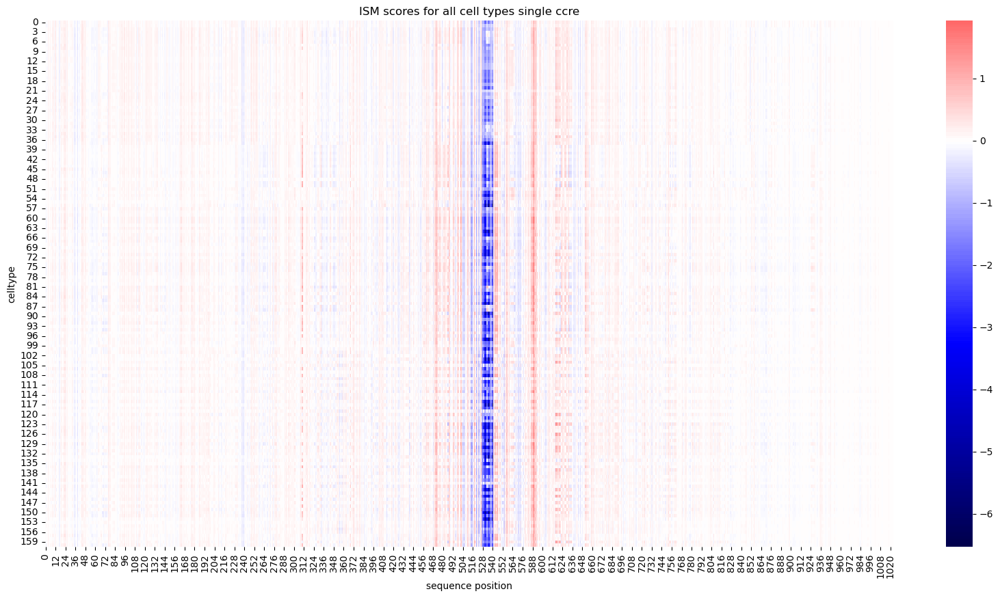

In [38]:
util.plot_all(class_out)

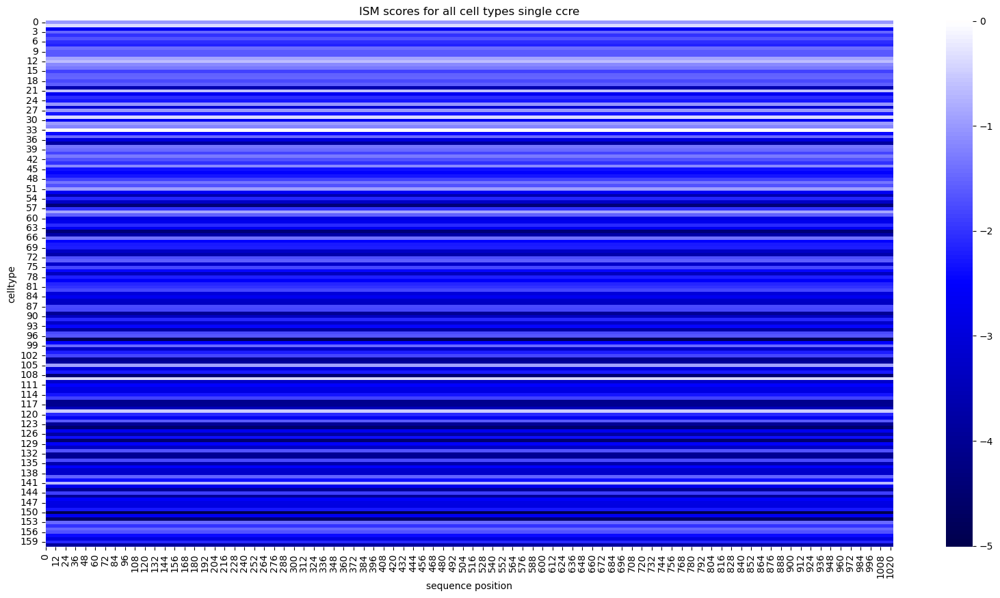

In [39]:
util.plot_all(reg_out)

In [40]:
reg_true.shape

(1, 1, 161)

In [41]:
print(reg_true[0,0,:])

[[[ 3.3401567e-01  1.1561574e-01  8.8219643e-01  5.0796825e-01
    6.6876072e-01  5.6363624e-01  6.9047785e-01  7.1942568e-01
    4.8204106e-01  5.4324090e-01  5.3998661e-01  2.9494053e-01
    2.1122205e-01  3.8693103e-01  4.3327010e-01  6.1370903e-01
    5.1476777e-01  5.0382304e-01  5.9603274e-01  5.3360891e-01
    1.1914115e+00  2.0343161e-01  8.9331055e-01  6.7865193e-01
    7.6086676e-01  3.4157759e-01  1.0412672e+00  3.3055907e-01
    7.6906121e-01  1.3370578e-01  9.0584671e-01  3.1379500e-01
    3.9352572e-01 -7.0049055e-04  8.0318958e-01  4.8975533e-01
    9.7980416e-01  1.2785822e+00  4.4447756e-01  4.8703170e-01
    6.0591483e-01  4.3776867e-01  5.6116050e-01  6.6843122e-01
    3.8775823e-01  7.7858996e-01  8.2588518e-01  7.5932825e-01
    6.2540966e-01  4.5535138e-01  5.7067108e-01  3.2447043e-01
    8.9854747e-01  1.2194018e+00  7.1665949e-01  1.1009309e+00
    1.4738145e+00  6.7194879e-01  2.9109135e-01  5.1135945e-01
    9.7266454e-01  9.1533697e-01  6.9784760e-01  8.8005

In [42]:
target,out = util.output_all(0)

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument index in method wrapper_CUDA__index_select)

In [43]:
for i in range(161):
    a,b = util.dataset[i]
    print(b[0]) #prints the classification, if see mostly 0, tells us that we will only see ism results for the subset of celltypes...

tensor([0])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([0])
tensor([1])
tensor([0])
tensor([1])
tensor([0])
tensor([0])
tensor([1])
tensor([1])
tensor([1])
tensor([0])
tensor([1])
tens

In [11]:
#let's fix the code
import torch 
import sys
import yaml 
sys.path.append('/data/leslie/sarthak/hyena/hyena-dna/')
from src.tasks.decoders import SequenceDecoder
from src.models.sequence.dna_embedding import DNAEmbeddingModel
from src.dataloaders.datasets.hg38_char_tokenizer import CharacterTokenizer
# import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import logomaker
from tqdm import tqdm
class ISMUtils():
    def __init__(self, model_type, ckpt_path, cfg = None, split = 'train', filter=True, classification = False):
        type_list = ['ccre', 'DNase_ctst', 'DNase_allcelltypes', 'DNase']
        if model_type not in type_list:
            raise ValueError('Model type not recognized')
        self.mtype = model_type
        if cfg is not None:
            cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/'+cfg
        self.classification = classification
        
        #check to see the type, and then load the right tokenizer, class and cfg
        if self.mtype == 'DNase':
            from src.dataloaders.datasets.DNase_dataset import DNaseDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N', 'S', 'U', 'V', 'W', 'X', 'Y', 'Z'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase.yaml'
                
        elif self.mtype == 'DNase_allcelltypes':
            from src.dataloaders.datasets.DNase_allcelltypes import DNaseAllCellTypeDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes.yaml'
                 

        elif self.mtype == 'DNase_ctst':
            from src.dataloaders.datasets.DNase_ctst_dataset import DNaseCtstDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst.yaml'

        else:
            raise ValueError('Model type not recognized')

        #now we load the model and dataset

        # self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.dataset = DatasetClass(max_length = 1024, split = split, tokenizer=self.tokenizer, rc_aug = False, tokenizer_name='char', add_eos='True', filter = filter, classification=self.classification)
        cfg = yaml.load(open(cfg, 'r'), Loader=yaml.FullLoader)
        
        train_cfg = cfg['train']  # grab section `train` section of config
        model_cfg = cfg['model_config']  # grab the `model` section of config
        d_output = train_cfg['d_output']
        backbone = DNAEmbeddingModel(**model_cfg)
        # backbone_skip = DNAEmbeddingModel(skip_embedding=True, **model_cfg)
        decoder = SequenceDecoder(model_cfg['d_model'], d_output=d_output, l_output=0, mode='pool')
        state_dict = torch.load(ckpt_path, map_location='cpu')  # has both backbone and decoder
        
        # loads model from ddp by removing prexix to single if necessary
        torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(
            state_dict["state_dict"], "model."
        )

        model_state_dict = state_dict["state_dict"]

        # need to remove torchmetrics. to remove keys, need to convert to list first
        for key in list(model_state_dict.keys()):
            if "torchmetrics" in key:
                model_state_dict.pop(key)

        # the state_dict keys slightly mismatch from Lightning..., so we fix it here
        decoder_state_dict = {}
        decoder_state_dict['output_transform.weight'] = model_state_dict.pop('decoder.0.output_transform.weight')
        decoder_state_dict['output_transform.bias'] = model_state_dict.pop('decoder.0.output_transform.bias')

        #now adjust the backbone if needed
        if self.mtype == 'DNase':
            embedding1 = torch.nn.Embedding(20, 128)
            # embedding2 = torch.nn.Embedding(20, 128)
            backbone.backbone.embeddings.word_embeddings = embedding1 #again a hack
            # backbone_skip.backbone.embeddings.word_embeddings = embedding2 #again a hack

        # now actually load the state dict to the decoder and backbone separately
        decoder.load_state_dict(decoder_state_dict, strict=True)
        backbone.load_state_dict(model_state_dict, strict=True)

        self.backbone = backbone.eval()
        self.decoder = decoder.eval()

        self.bed = pd.read_csv('/data/leslie/sarthak/data/GRCh38-cCREs.bed', header=None, delimiter='\t').to_numpy()
        self.middle = 1023//2 #just used for the logo plots

    def calculate_ISM(self,ccre, cuda = False, return_out = False, progress_bar = False):
        #does ISM for that ccre, based on the model type
        #Does what the ISM.py and ISM_allcelltypes.py files do but for one ccre at a time
        #ccre should be the index of the ccre, not the index to get that dataset
        device = "cuda:0" if cuda else "cpu"
        backbone = self.backbone.to(device)
        decoder = self.decoder.to(device)
        #first have to load in the batch
        #if it's the different groups have very different dataset classes
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
            ccre_list = []
            out_list = []
            class_list = []
            for i in range(161):
                a,b = self.dataset[ccre+i]
                ccre_list.append(a)
                if self.classification:
                    # raise NotImplementedError('This is not implemented yet, need to consider how to do ISM with the classification model')
                    class_list.append(b[0].item())
                    b = b[1] #just ignore the classification stuff?
                out_list.append(b.item())
            ccre_list = torch.stack(ccre_list)
        else:
            ccre_list = self.dataset[ccre][0].unsqueeze(0)
            class_list = self.dataset[ccre][1][0] #the classification stuff
        # print(class_list)
        # return 0
        temp,_ = backbone(ccre_list.to(device)) #pass whole ccre as a batch
        out = decoder(temp)
        seqlen = ccre_list.shape[1] #because it's batch x seq

        if self.classification:
            out_class = out[:,:out.shape[1]//2]
            out = out[:,out.shape[1]//2:] #just ignore the classification stuff? for now maybe and we just look at the regression outputs?
            #but if it thinks that the thing is closed, we should keep it as 0... or maybe set it to some other value? idk
            #i say keep it but we know that we can mask it, no let's mask for reg, but still need to use for class...
            #and let's keep the class out
            out_class_gt_np = out_class.detach().cpu().numpy().reshape(1,1,161)
            ISM_class = np.ones((4,seqlen,161))*out_class_gt_np

        out_gt_np = out.detach().cpu().numpy().reshape(1, 1, 161) #the initial output of the model before ism
        if self.classification:
            mask_idx = np.array(class_list) == 1 #if it's open
            #now we make this a matrix of the same size as the output which will be 3x1x161 or just 3x161
            mask = np.zeros((1,1,161))
            mask[:,:,mask_idx] = 1
        # print(mask)
        #now we can calculate the ISM
        #we add someway to return the output of the model as well if we want to
        ISM_results = np.ones((4,seqlen,161))*out_gt_np
        # if self.mtype == 'DNase_ctst': #no longer need because not defining the shape manually as 1023 or 1024, just seqlen
            # ISM_results = np.ones((4,seqlen,161))*out_gt_np #because is full 1024 sequence length...
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst': #we just need the first sequence, don't care about the useless stuff
            seq = ccre_list[0]
        else:
            seq = ccre_list.squeeze() #get rid f the embedding dimension
        token_list = [7,8,9,10] #tokenize this list first

        if progress_bar:
            iterator = tqdm(enumerate(seq), total = len(seq))
        else:
            iterator = enumerate(seq)
        with torch.no_grad():
            for idx, nucleotide in iterator: 
                temp_token_list = token_list.copy() #we make a copy
                # print(nucleotide)
                if nucleotide not in temp_token_list:
                    continue #basically skips this and none of it is updated, because is a weird tooken, whether permutation, ctst or something else
                temp_token_list.remove(nucleotide)
                temp_token_list = np.array(temp_token_list)
                #we can now compute a mask if self.classification that masks some values
                results_list = []
                class_results_list = []
                for j in temp_token_list:
                    temp_seq = ccre_list.clone() #never put on the gpu
                    if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
                        # if self.classification:
                            # temp_seq[mask,idx] = j #so it's still run through the model, but only the ones that are altered??
                            #no, because can't do it for multitasking model...
                        # else:
                        temp_seq[:,idx] = j
                    else:
                        temp_seq[idx] = j
                    a,_ = backbone(temp_seq.to(device))
                    out = decoder(a)
                    if self.classification:
                        #only look at the second half of the output anyways
                        #and also have to consider multiplying by the mask
                        reg_out = out[:,out.shape[1]//2:].detach().cpu().numpy()
                        # reg_out = reg_out * mask
                        results_list.append(reg_out.squeeze())
                        class_out = out[:,:out.shape[1]//2]
                        class_results_list.append(class_out.detach().cpu().numpy().squeeze())
                    else:
                        results_list.append(out.detach().cpu().numpy()) #shape will be 161x1 which is fine...
                ISM_results[temp_token_list-7,idx,:] = np.array(results_list).squeeze()
                if self.classification:
                    ISM_class[temp_token_list-7,idx,:] = np.array(class_results_list).squeeze()
                
        #relatively slow on the CPU
        #and now we subtract the out_gt from it
        ISM_results_normalized = ISM_results - out_gt_np #is mutated - reference
        if self.classification:
            ISM_class_normalized = ISM_class - out_class_gt_np
            ISM_results_normalized *= mask
        if self.classification and return_out:
            return ISM_results_normalized, ISM_class_normalized, out_gt_np, out_class_gt_np
        elif self.classification:
            return ISM_results_normalized, ISM_class_normalized 
        elif return_out: #but this is optional
            return ISM_results_normalized, out_gt_np
        return ISM_results_normalized

    def var(self, idx):
        #This is the idx for the ccre, so if you want it for ccre 2 it's just idx == 2. Not 161*idx
        seq_idx = idx
        cCRE_id = self.dataset.array[seq_idx][0] #get the id from the array
        row = self.dataset.cCRE_dict[cCRE_id]
        #now we can calculate the variance using this data
        # print(np.var(dnase_filtered[row,:])) #identical
        
        return np.var(self.dataset.cell_dnase_levels[row,:])

    def output(self,idx):
        #given the index, this finds the associated output (single value)
        #this literally just puts it thorugh the model, but it's like 2 lines of code and really easy to do yourself
        a,b = self.dataset[idx]
        temp,_ = self.backbone(a.unsqueeze(0))
        out = self.decoder(temp)

        if self.mtype == 'DNase':
            print(f'predicted output: {out}, actual output: {b}')
            return b, out

        elif self.mtype == 'DNase_allcelltypes':
            print(f'predicted output: {out[0,0]}, actual output: {b[0]}')
            return b[0], out[0,0]

    def output_all(self,idx, print_out = False):
        #given the index, this finds the associated output (all values averaged across the cell types for a singel ccre)
        #if it's DNase, then we need to do it for all the cell types, here the input idx should not be 161 times any number, rather just the ccre number
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            idx = 161*idx
            out_list = []
            target_list = []
            for i in range(161):
                a,b = self.dataset[idx+i]
                temp,_ = self.backbone(a.unsqueeze(0))
                out = self.decoder(temp)
                out_list.append(out.item())
                if isinstance(b,tuple):
                    raise NotImplementedError('This is not implemented yet, need to consider how to do handle these outputs and what we want to display')
                target_list.append(b.item())
            out = np.mean(out_list)
            if print_out:
                print(f'predicted output mean: {out}, actual output mean: {np.mean(target_list)}')
            #but return the whole lists
            return np.array(target_list), np.array(out_list)

        if self.mtype == 'DNase_allcelltypes':
            a,b = self.dataset[idx]
            temp,_ = self.backbone(a.unsqueeze(0))
            out = self.decoder(temp)
            print(f'predicted output mean: {torch.mean(out)}, actual output mean: {torch.mean(b)}')
            return b.detach().numpy(), out.detach().numpy()

    def plot_singlecelltype(self, data, celltype = 0):
        #given the index, this finds the associated output (single value)
        #we can either take in the actual data, or the ccre number
        #actual data must be formatted the same as the saved data
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray: #you can also just give it the data and then it doesn't need to load it
            data_loaded = data
        fig, ax = plt.subplots(1,1, figsize = (20,10))
        sns.heatmap(data_loaded[:,:,celltype], cmap = 'seismic', center = 0)
        plt.yticks([0.5,1.5,2.5,3.5],['A','C','G','T'])
        plt.xlabel('sequence position')
        plt.title(f'ISM scores for the {celltype} cell type of the {data} ccre')
        plt.show()

    def plot_all(self,data):
        #once again can give the ccre or the actual data
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray:
            data_loaded = data
        fig, ax = plt.subplots(1,1, figsize = (20,10))
        sns.heatmap(data_loaded.sum(axis = 0).T, cmap = 'seismic', center = 0)
        plt.ylabel('celltype')
        plt.xlabel('sequence position')
        plt.title('ISM scores for all cell types single ccre')
        plt.show()

    def default_heights(self,data):
        #it will sum across the nucelotides and average over the celltypes
        if type(data) == int:
            data_loaded = np.load(f'/data/leslie/sarthak/hyena/hyena-dna/shap_analysis/saved_ISM/ISM_run1_normalized_{data}.npy')
        elif type(data) == np.ndarray:
            data_loaded = data
        return data_loaded.sum(axis = 0).mean(axis = 1)

    def logoplot(self,ccre,heights = None, startend=None,flip_heights = False): #potentially we add the title as an input into the model
        #so given the ccre number and the heights, this will plot the logo plot
        #note ccre should be the ccre number regardless of the model type
        #heights must be provided, is usually the sum across the axis=1 for the data that is used for plot_all, uses same start and end
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
        a,b = self.dataset[ccre]
        seq=self.dataset.tokenizer.decode(a)
        if startend is None and self.mtype == 'DNase':
            start = self.middle-50+4
            end = self.middle+50+4
        elif startend is None and self.mtype == 'DNase_allcelltypes':
            start = self.middle-50
            end = self.middle+50
        elif self.mtype == 'DNase': #if specify it, add 4 to the dnase, just so aligns with the multitasking model
            start = startend[0]+4
            end = startend[1]+4
        elif self.mtype == 'DNase_ctst':
            start = startend[0]+1
            end = startend[1]+1
        else:
            start = startend[0]
            end = startend[1]

        #now we can define cut_seq
        cut_seq = seq[start:end]
                    
        if heights is None:
            raise ValueError('Need to provide heights')

        #now we define cut heights
        heights = heights[start:end]
        if flip_heights:
            heights = -heights
        logo_df = pd.DataFrame(0, index=np.arange(len(cut_seq)), columns=list(set(cut_seq)), dtype=float)

        # Fill the DataFrame with heights, converting heights to float if necessary
        for i, symbol in enumerate(cut_seq):
            logo_df.loc[i, symbol] = heights[i]

        # Generate the sequence logo
        # fig, ax = 
        # fig.set_size_inches(20, 3)  # Set the desired width and height here        
        logo = logomaker.Logo(logo_df, color_scheme='classic', flip_below = True, figsize = (20,3))
        plt.title('Sequence logo')
        # fig.show()
    
    def find_ccre_type(self, idx):
        #this function will use the ccre id to find the specific type
        #uses the index of the dataset, not the cCRE for the DNase model!!
        #first get the id
        if self.mtype == 'DNase':        
            seq_idx = int(idx/self.dataset.cell_types)
        else:
            seq_idx = idx
        ccre_id = self.dataset.array[seq_idx][0]
        line = np.where(self.bed[:,3] == ccre_id)
        return self.bed[line[0][0], -1]


In [12]:
#now test this! We can use return to stop the funciton early and have it make sure we get the proper shapes!
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)

 15%|█▌        | 155/1024 [00:16<01:34,  9.17it/s]

100%|██████████| 1024/1024 [01:51<00:00,  9.15it/s]


In [13]:
#let's look at class out
reg_out, class_out, reg_true, class_true = out
print(reg_out.shape,class_out.shape)

(4, 1024, 161) (4, 1024, 161)


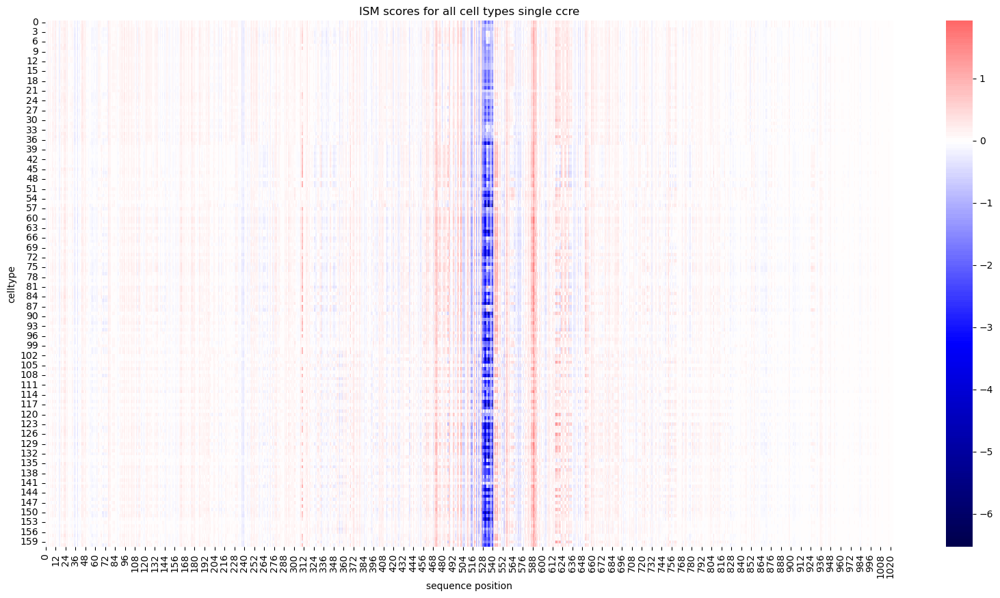

In [14]:
util.plot_all(class_out)

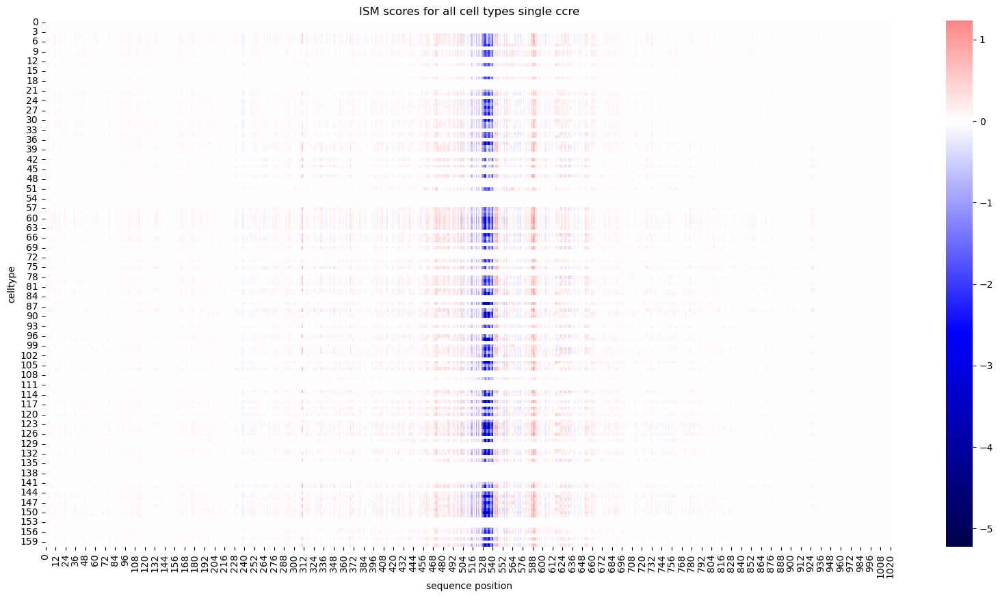

In [15]:
util.plot_all(reg_out)

In [16]:
reg_out[1]

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ..., -0.00356406,
         0.        , -0.0232079 ],
       [-0.        , -0.        ,  0.        , ...,  0.01003897,
         0.        ,  0.01566041],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.0004648 ,
         0.        ,  0.00047183],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [17]:
class_out[1]

array([[ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 8.11290741e-03, -1.23283863e-02,  1.89418793e-02, ...,
         1.14862919e-02, -2.10542679e-02, -7.10425377e-02],
       [-6.21008873e-03, -5.46956062e-03,  7.02238083e-03, ...,
         8.55422020e-03, -2.99072266e-03,  2.85081863e-02],
       ...,
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [ 2.82287598e-04,  3.33786011e-04, -2.05993652e-04, ...,
        -3.48567963e-04,  4.38690186e-05, -1.16157532e-03],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [18]:
reg_out.shape

(4, 1024, 161)

In [19]:
print(reg_out[3,19,20])
print(class_out[3,19,20])

-0.0
0.04106330871582031


In [20]:
print(reg_out[3,29,:])
print(class_out[3,29,:])

[-0.         -0.         -0.         -0.         -0.01396066 -0.01679426
 -0.01605284 -0.02403408 -0.         -0.02356011 -0.02386451 -0.
 -0.         -0.02687004 -0.         -0.         -0.         -0.02322018
 -0.         -0.         -0.         -0.02379636 -0.00837719 -0.
 -0.02361917 -0.01680267 -0.01407135 -0.02764243 -0.02279669 -0.
 -0.02201766 -0.01689225 -0.01488906 -0.         -0.00832659 -0.02931318
 -0.         -0.01262093 -0.01197043 -0.00966042 -0.         -0.
 -0.01316273 -0.         -0.01478499 -0.         -0.         -0.00556397
 -0.         -0.         -0.         -0.01221424 -0.         -0.
 -0.         -0.          0.         -0.01386631 -0.00757051 -0.00850093
 -0.02045423 -0.01955736 -0.01200253 -0.01596117 -0.         -0.00467515
 -0.01880714 -0.01525819 -0.         -0.00732666 -0.         -0.
 -0.         -0.00781775 -0.         -0.02127773 -0.          0.
 -0.00364679  0.00422895 -0.00781059 -0.         -0.01823997 -0.01866865
 -0.         -0.         -0.013386

# testing ISM and speeding it up

In [1]:
#let's fix the code
import torch 
import sys
import yaml 
sys.path.append('/data/leslie/sarthak/hyena/hyena-dna/')
from src.tasks.decoders import SequenceDecoder
from src.models.sequence.dna_embedding import DNAEmbeddingModel
from src.dataloaders.datasets.hg38_char_tokenizer import CharacterTokenizer
# import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import logomaker
from tqdm import tqdm
import time
class ISMUtils():
    def __init__(self, model_type, ckpt_path, cfg = None, split = 'train', filter=True, classification = False):
        type_list = ['ccre', 'DNase_ctst', 'DNase_allcelltypes', 'DNase']
        if model_type not in type_list:
            raise ValueError('Model type not recognized')
        self.mtype = model_type
        if cfg is not None:
            cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/'+cfg
        self.classification = classification
        
        #check to see the type, and then load the right tokenizer, class and cfg
        if self.mtype == 'DNase':
            from src.dataloaders.datasets.DNase_dataset import DNaseDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N', 'S', 'U', 'V', 'W', 'X', 'Y', 'Z'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase.yaml'
                
        elif self.mtype == 'DNase_allcelltypes':
            from src.dataloaders.datasets.DNase_allcelltypes import DNaseAllCellTypeDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes.yaml'
                 

        elif self.mtype == 'DNase_ctst':
            from src.dataloaders.datasets.DNase_ctst_dataset import DNaseCtstDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst.yaml'

        else:
            raise ValueError('Model type not recognized')

        #now we load the model and dataset

        # self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.dataset = DatasetClass(max_length = 1024, split = split, tokenizer=self.tokenizer, rc_aug = False, tokenizer_name='char', add_eos='True', filter = filter, classification=self.classification)
        cfg = yaml.load(open(cfg, 'r'), Loader=yaml.FullLoader)
        
        train_cfg = cfg['train']  # grab section `train` section of config
        model_cfg = cfg['model_config']  # grab the `model` section of config
        d_output = train_cfg['d_output']
        backbone = DNAEmbeddingModel(**model_cfg)
        # backbone_skip = DNAEmbeddingModel(skip_embedding=True, **model_cfg)
        decoder = SequenceDecoder(model_cfg['d_model'], d_output=d_output, l_output=0, mode='pool')
        state_dict = torch.load(ckpt_path, map_location='cpu')  # has both backbone and decoder
        
        # loads model from ddp by removing prexix to single if necessary
        torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(
            state_dict["state_dict"], "model."
        )

        model_state_dict = state_dict["state_dict"]

        # need to remove torchmetrics. to remove keys, need to convert to list first
        for key in list(model_state_dict.keys()):
            if "torchmetrics" in key:
                model_state_dict.pop(key)

        # the state_dict keys slightly mismatch from Lightning..., so we fix it here
        decoder_state_dict = {}
        decoder_state_dict['output_transform.weight'] = model_state_dict.pop('decoder.0.output_transform.weight')
        decoder_state_dict['output_transform.bias'] = model_state_dict.pop('decoder.0.output_transform.bias')

        #now adjust the backbone if needed
        if self.mtype == 'DNase':
            embedding1 = torch.nn.Embedding(20, 128)
            # embedding2 = torch.nn.Embedding(20, 128)
            backbone.backbone.embeddings.word_embeddings = embedding1 #again a hack
            # backbone_skip.backbone.embeddings.word_embeddings = embedding2 #again a hack

        # now actually load the state dict to the decoder and backbone separately
        decoder.load_state_dict(decoder_state_dict, strict=True)
        backbone.load_state_dict(model_state_dict, strict=True)

        self.backbone = backbone.eval()
        self.decoder = decoder.eval()

        self.bed = pd.read_csv('/data/leslie/sarthak/data/GRCh38-cCREs.bed', header=None, delimiter='\t').to_numpy()
        self.middle = 1023//2 #just used for the logo plots

    def calculate_ISM(self,ccre, cuda = False, return_out = False, progress_bar = False, stop=False):
        #does ISM for that ccre, based on the model type
        #Does what the ISM.py and ISM_allcelltypes.py files do but for one ccre at a time
        #ccre should be the index of the ccre, not the index to get that dataset
        device = "cuda:0" if cuda else "cpu"
        backbone = self.backbone.to(device)
        decoder = self.decoder.to(device)
        #first have to load in the batch
        #if it's the different groups have very different dataset classes
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
            ccre_list = []
            out_list = []
            class_list = []
            for i in range(161):
                a,b = self.dataset[ccre+i]
                ccre_list.append(a)
                if self.classification:
                    # raise NotImplementedError('This is not implemented yet, need to consider how to do ISM with the classification model')
                    class_list.append(b[0].item())
                    b = b[1] #just ignore the classification stuff?
                out_list.append(b.item())
            ccre_list = torch.stack(ccre_list)
        else:
            ccre_list = self.dataset[ccre][0].unsqueeze(0)
            class_list = self.dataset[ccre][1][0] #the classification stuff
        # print(class_list)
        temp,_ = backbone(ccre_list.to(device)) #pass whole ccre as a batch
        out = decoder(temp)
        seqlen = ccre_list.shape[1] #because it's batch x seq
        dim_out = out.shape[1]//2

        if self.classification:
            out_class = out[:,:dim_out]
            out = out[:,dim_out:] #just ignore the classification stuff? for now maybe and we just look at the regression outputs?
            #but if it thinks that the thing is closed, we should keep it as 0... or maybe set it to some other value? idk
            #i say keep it but we know that we can mask it, no let's mask for reg, but still need to use for class...
            #and let's keep the class out
            out_class_gt_np = out_class.detach().cpu().numpy().reshape(1,1,161)
            ISM_class = np.ones((4,seqlen,161))*out_class_gt_np

        out_gt_np = out.detach().cpu().numpy().reshape(1, 1, 161) #the initial output of the model before ism
        # if self.classification:
        #     mask_idx = np.array(class_list) == 1 #if it's open
        #     #now we make this a matrix of the same size as the output which will be 3x1x161 or just 3x161
        #     mask = np.zeros((1,1,161))
        #     mask[:,:,mask_idx] = 1
        # print(mask)
        #now we can calculate the ISM
        #we add someway to return the output of the model as well if we want to
        ISM_results = np.ones((4,seqlen,161))*out_gt_np
        # if self.mtype == 'DNase_ctst': #no longer need because not defining the shape manually as 1023 or 1024, just seqlen
            # ISM_results = np.ones((4,seqlen,161))*out_gt_np #because is full 1024 sequence length...
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst': #we just need the first sequence, don't care about the useless stuff
            seq = ccre_list[0]
        else:
            seq = ccre_list.squeeze() #get rid f the embedding dimension
        token_list = [7,8,9,10] #tokenize this list first
        mutations = {
            7: np.array([8,9,10]),
            8: np.array([7,9,10]),
            9: np.array([7,8,10]),
            10: np.array([7,8,9])
        }
        ccre_list_gpu = ccre_list.to(device)

        if progress_bar:
            iterator = tqdm(enumerate(seq), total = len(seq))
        else:
            iterator = enumerate(seq)
        with torch.no_grad():
            for idx, nucleotide in iterator: 
                # temp_token_list = token_list.copy() #we make a copy
                # print(nucleotide)
                if nucleotide not in token_list:
                    continue #basically skips this and none of it is updated, because is a weird tooken, whether permutation, ctst or something else
                # temp_token_list.remove(nucleotide)
                # temp_token_list = np.array(temp_token_list)
                #we can now compute a mask if self.classification that masks some values
                temp_token_list = mutations[nucleotide.item()]
                # results_list = []
                # class_results_list = []
                #use torch tensor instead of the right size
                reg_results = torch.zeros(3,dim_out,161).to(device)
                class_results = torch.zeros(3,dim_out,161).to(device)
                for idx2,j in enumerate(temp_token_list):
                    temp_seq = ccre_list_gpu.clone() #never put on the gpu
                    if self.mtype in ['DNase', 'DNase_ctst']:
                        temp_seq[:,idx] = j
                    else:
                        temp_seq[idx] = j
                    # if idx %2 == 0:
                    a,_ = backbone(temp_seq)
                    out = decoder(a)
                    if self.classification:
                        #only look at the second half of the output anyways
                        #and also have to consider multiplying by the mask
                        # reg_out = out[:,out.shape[1]//2:].detach().cpu().numpy()
                        # reg_out = reg_out * mask
                        reg_results[idx2] = out[:,dim_out:].T
                        # results_list.append(reg_out.squeeze())
                        # class_out = out[:,:out.shape[1]//2]
                        class_results[idx2] = out[:,:dim_out].T
                        # class_results_list.append(class_out.detach().cpu().numpy().squeeze())
                    else:
                        results_list.append(out.detach().cpu().numpy()) #shape will be 161x1 which is fine...
                # print(reg_results.shape)
                ISM_results[temp_token_list-7,idx,:] = reg_results.cpu().numpy().squeeze()
                if self.classification:
                    ISM_class[temp_token_list-7,idx,:] = class_results.cpu().numpy().squeeze()
                # if idx == stop:
                #     break
                
        #relatively slow on the CPU
        #and now we subtract the out_gt from it
        ISM_results_normalized = ISM_results - out_gt_np #is mutated - reference
        if self.classification:
            ISM_class_normalized = ISM_class - out_class_gt_np
            # ISM_results_normalized *= mask
        if self.classification and return_out:
            return ISM_results_normalized, ISM_class_normalized, out_gt_np, out_class_gt_np
        elif self.classification:
            return ISM_results_normalized, ISM_class_normalized 
        elif return_out: #but this is optional
            return ISM_results_normalized, out_gt_np
        return ISM_results_normalized

    def var(self, idx):
        #This is the idx for the ccre, so if you want it for ccre 2 it's just idx == 2. Not 161*idx
        seq_idx = idx
        cCRE_id = self.dataset.array[seq_idx][0] #get the id from the array
        row = self.dataset.cCRE_dict[cCRE_id]
        #now we can calculate the variance using this data
        # print(np.var(dnase_filtered[row,:])) #identical
        
        return np.var(self.dataset.cell_dnase_levels[row,:])

    def output(self,idx):
        #given the index, this finds the associated output (single value)
        #this literally just puts it thorugh the model, but it's like 2 lines of code and really easy to do yourself
        a,b = self.dataset[idx]
        temp,_ = self.backbone(a.unsqueeze(0))
        out = self.decoder(temp)

        if self.mtype == 'DNase':
            print(f'predicted output: {out}, actual output: {b}')
            return b, out

        elif self.mtype == 'DNase_allcelltypes':
            print(f'predicted output: {out[0,0]}, actual output: {b[0]}')
            return b[0], out[0,0]

    def output_all(self,idx, print_out = False):
        #given the index, this finds the associated output (all values averaged across the cell types for a singel ccre)
        #if it's DNase, then we need to do it for all the cell types, here the input idx should not be 161 times any number, rather just the ccre number
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            idx = 161*idx
            out_list = []
            target_list = []
            for i in range(161):
                a,b = self.dataset[idx+i]
                temp,_ = self.backbone(a.unsqueeze(0))
                out = self.decoder(temp)
                out_list.append(out.item())
                if isinstance(b,tuple):
                    raise NotImplementedError('This is not implemented yet, need to consider how to do handle these outputs and what we want to display')
                target_list.append(b.item())
            out = np.mean(out_list)
            if print_out:
                print(f'predicted output mean: {out}, actual output mean: {np.mean(target_list)}')
            #but return the whole lists
            return np.array(target_list), np.array(out_list)

        if self.mtype == 'DNase_allcelltypes':
            a,b = self.dataset[idx]
            temp,_ = self.backbone(a.unsqueeze(0))
            out = self.decoder(temp)
            print(f'predicted output mean: {torch.mean(out)}, actual output mean: {torch.mean(b)}')
            return b.detach().numpy(), out.detach().numpy()
    
    def find_ccre_type(self, idx):
        #this function will use the ccre id to find the specific type
        #uses the index of the dataset, not the cCRE for the DNase model!!
        #first get the id
        if self.mtype == 'DNase':        
            seq_idx = int(idx/self.dataset.cell_types)
        else:
            seq_idx = idx
        ccre_id = self.dataset.array[seq_idx][0]
        line = np.where(self.bed[:,3] == ccre_id)
        return self.bed[line[0][0], -1]


In [5]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#only .1 seconds to load in the data...
#each iteration of the loop takes much longer
#9 it/s so that means for all celltypes, it will be done in 2 minutes per CRE
#the slowdown of .1 s might actually be a little bit? relatively small tho? I'm not sure...
#2 minutes for the CRE pretty much, the other overhead is minimal comparitively
#could double the speed if we were to do only the middle half, but would be much faster if we can find a way to speed it up,
# maybe it's the running through the model, what if we found an efficient way to batch it?

 39%|███▉      | 404/1024 [00:46<01:11,  8.66it/s]

100%|██████████| 1024/1024 [01:58<00:00,  8.65it/s]


In [11]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#a tad bit faster, like .05 it/s faster... for usint the dictionary
#wait no now it slows back down... it's basically the same speed lol
#and even slowed down towards the end... basically no speedup

 92%|█████████▏| 939/1024 [01:49<00:10,  8.42it/s]

In [15]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#the thing we changed now is having it on the gpu already
#this leads to a deent speed up that saves roughly 5 seconds, still quite slow, now 8.9 it/s instead of 8.65
#wait after a bit returned to that same speed, so not a speedup at all

 79%|███████▊  | 805/1024 [01:31<00:25,  8.61it/s]

In [6]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#now moving the list appending operations to not be there, 
#and it's basically the same speed... so it seems to be the running through the model that is the slow part

100%|██████████| 1024/1024 [01:57<00:00,  8.71it/s]


In [2]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#oh I had a bug, when we fixed it we see that we go 

100%|██████████| 1024/1024 [01:56<00:00,  8.76it/s]


In [5]:
#now that we use tensors, we can go ahead and find some ways to use larger batches

#let's fix the code
import torch 
import sys
import yaml 
sys.path.append('/data/leslie/sarthak/hyena/hyena-dna/')
from src.tasks.decoders import SequenceDecoder
from src.models.sequence.dna_embedding import DNAEmbeddingModel
from src.dataloaders.datasets.hg38_char_tokenizer import CharacterTokenizer
# import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import logomaker
from tqdm import tqdm
import time
class ISMUtils():
    def __init__(self, model_type, ckpt_path, cfg = None, split = 'train', filter=True, classification = False):
        type_list = ['ccre', 'DNase_ctst', 'DNase_allcelltypes', 'DNase']
        if model_type not in type_list:
            raise ValueError('Model type not recognized')
        self.mtype = model_type
        if cfg is not None:
            cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/'+cfg
        self.classification = classification
        
        #check to see the type, and then load the right tokenizer, class and cfg
        if self.mtype == 'DNase':
            from src.dataloaders.datasets.DNase_dataset import DNaseDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N', 'S', 'U', 'V', 'W', 'X', 'Y', 'Z'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase.yaml'
                
        elif self.mtype == 'DNase_allcelltypes':
            from src.dataloaders.datasets.DNase_allcelltypes import DNaseAllCellTypeDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes.yaml'
                 

        elif self.mtype == 'DNase_ctst':
            from src.dataloaders.datasets.DNase_ctst_dataset import DNaseCtstDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst.yaml'

        else:
            raise ValueError('Model type not recognized')

        #now we load the model and dataset

        # self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.dataset = DatasetClass(max_length = 1024, split = split, tokenizer=self.tokenizer, rc_aug = False, tokenizer_name='char', add_eos='True', filter = filter, classification=self.classification)
        cfg = yaml.load(open(cfg, 'r'), Loader=yaml.FullLoader)
        
        train_cfg = cfg['train']  # grab section `train` section of config
        model_cfg = cfg['model_config']  # grab the `model` section of config
        d_output = train_cfg['d_output']
        backbone = DNAEmbeddingModel(**model_cfg)
        # backbone_skip = DNAEmbeddingModel(skip_embedding=True, **model_cfg)
        decoder = SequenceDecoder(model_cfg['d_model'], d_output=d_output, l_output=0, mode='pool')
        state_dict = torch.load(ckpt_path, map_location='cpu')  # has both backbone and decoder
        
        # loads model from ddp by removing prexix to single if necessary
        torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(
            state_dict["state_dict"], "model."
        )

        model_state_dict = state_dict["state_dict"]

        # need to remove torchmetrics. to remove keys, need to convert to list first
        for key in list(model_state_dict.keys()):
            if "torchmetrics" in key:
                model_state_dict.pop(key)

        # the state_dict keys slightly mismatch from Lightning..., so we fix it here
        decoder_state_dict = {}
        decoder_state_dict['output_transform.weight'] = model_state_dict.pop('decoder.0.output_transform.weight')
        decoder_state_dict['output_transform.bias'] = model_state_dict.pop('decoder.0.output_transform.bias')

        #now adjust the backbone if needed
        if self.mtype == 'DNase':
            embedding1 = torch.nn.Embedding(20, 128)
            # embedding2 = torch.nn.Embedding(20, 128)
            backbone.backbone.embeddings.word_embeddings = embedding1 #again a hack
            # backbone_skip.backbone.embeddings.word_embeddings = embedding2 #again a hack

        # now actually load the state dict to the decoder and backbone separately
        decoder.load_state_dict(decoder_state_dict, strict=True)
        backbone.load_state_dict(model_state_dict, strict=True)

        self.backbone = backbone.eval()
        self.decoder = decoder.eval()

        self.bed = pd.read_csv('/data/leslie/sarthak/data/GRCh38-cCREs.bed', header=None, delimiter='\t').to_numpy()
        self.middle = 1023//2 #just used for the logo plots

    def calculate_ISM(self,ccre, cuda = False, return_out = False, progress_bar = False, stop=False):
        #does ISM for that ccre, based on the model type
        #Does what the ISM.py and ISM_allcelltypes.py files do but for one ccre at a time
        #ccre should be the index of the ccre, not the index to get that dataset
        # start = time.time()
        device = "cuda:0" if cuda else "cpu"
        backbone = self.backbone.to(device)
        decoder = self.decoder.to(device)
        #first have to load in the batch
        #if it's the different groups have very different dataset classes
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
            ccre_list = []
            out_list = []
            class_list = []
            for i in range(161):
                a,b = self.dataset[ccre+i]
                ccre_list.append(a)
                if self.classification:
                    # raise NotImplementedError('This is not implemented yet, need to consider how to do ISM with the classification model')
                    class_list.append(b[0].item())
                    b = b[1] #just ignore the classification stuff?
                out_list.append(b.item())
            ccre_list = torch.stack(ccre_list)
        else:
            ccre_list = self.dataset[ccre][0].unsqueeze(0)
            class_list = self.dataset[ccre][1][0] #the classification stuff
        # print(class_list)
        temp,_ = backbone(ccre_list.to(device)) #pass whole ccre as a batch
        out = decoder(temp)
        seqlen = ccre_list.shape[1] #because it's batch x seq
        dim_out = out.shape[1]//2

        if self.classification:
            out_class = out[:,:dim_out]
            out = out[:,dim_out:] #just ignore the classification stuff? for now maybe and we just look at the regression outputs?
            #but if it thinks that the thing is closed, we should keep it as 0... or maybe set it to some other value? idk
            #i say keep it but we know that we can mask it, no let's mask for reg, but still need to use for class...
            #and let's keep the class out
            out_class_gt = out_class.detach().reshape(1,1,161)
            ISM_class = torch.ones((4,seqlen,161)).to(device)*out_class_gt
            out_class_gt_np = out_class.detach().cpu().numpy().reshape(1,1,161)
            
        out_gt = out.detach().reshape(1,1,161)
        ISM_results = torch.ones((4,seqlen,161)).to(device)*out_gt
        out_gt_np = out.detach().cpu().numpy().reshape(1, 1, 161) #the initial output of the model before ism
        # if self.classification:
        #     mask_idx = np.array(class_list) == 1 #if it's open
        #     #now we make this a matrix of the same size as the output which will be 3x1x161 or just 3x161
        #     mask = np.zeros((1,1,161))
        #     mask[:,:,mask_idx] = 1
        # print(mask)
        #now we can calculate the ISM
        #we add someway to return the output of the model as well if we want to
        # ISM_results = np.ones((4,seqlen,161))*out_gt_np
        # if self.mtype == 'DNase_ctst': #no longer need because not defining the shape manually as 1023 or 1024, just seqlen
            # ISM_results = np.ones((4,seqlen,161))*out_gt_np #because is full 1024 sequence length...
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst': #we just need the first sequence, don't care about the useless stuff
            seq = ccre_list[0]
        else:
            seq = ccre_list.squeeze() #get rid f the embedding dimension
        token_list = [7,8,9,10] #tokenize this list first
        mutations = {
            7: np.array([8,9,10]),
            8: np.array([7,9,10]),
            9: np.array([7,8,10]),
            10: np.array([7,8,9])
        }
        ccre_list_gpu = ccre_list.to(device)
        # end = time.time()
        # print(f'setup: {end-start}')

        if progress_bar:
            iterator = tqdm(enumerate(seq), total = len(seq))
        else:
            iterator = enumerate(seq)
        with torch.no_grad():
            for idx, nucleotide in iterator: 
                # temp_token_list = token_list.copy() #we make a copy
                # print(nucleotide)
                if nucleotide not in token_list:
                    continue #basically skips this and none of it is updated, because is a weird tooken, whether permutation, ctst or something else
                # temp_token_list.remove(nucleotide)
                # temp_token_list = np.array(temp_token_list)
                #we can now compute a mask if self.classification that masks some values
                # start = time.time()
                temp_token_list = mutations[nucleotide.item()]
                # end = time.time()
                # print(f'.item: {end-start}')
                # results_list = []
                # class_results_list = []
                #use torch tensor instead of the right size
                # start = time.time()
                reg_results = torch.zeros(3,dim_out,161).to(device)
                class_results = torch.zeros(3,dim_out,161).to(device)
                # end = time.time()
                # print(f'create tensor: {end-start}')
                for idx2,j in enumerate(temp_token_list):
                    # start = time.time()
                    temp_seq = ccre_list_gpu.clone() #never put on the gpu
                    if self.mtype in ['DNase', 'DNase_ctst']:
                        temp_seq[:,idx] = j
                    else:
                        temp_seq[idx] = j
                    # end = time.time()
                    # print(f'altering: {end-start}')
                    # start = time.time()
                    a,_ = backbone(temp_seq)
                    out = decoder(a)
                    torch.cuda.synchronize() #let's make it synchronize then test
                    # end = time.time()
                    # print(f'model: {end-start}') #bro this ain't even the slowdown
                    # return 0
                    # start = time.time()
                    if self.classification:
                        #only look at the second half of the output anyways
                        #and also have to consider multiplying by the mask
                        # reg_out = out[:,out.shape[1]//2:].detach().cpu().numpy()
                        # reg_out = reg_out * mask
                        reg_results[idx2] = out[:,dim_out:].T
                        # results_list.append(reg_out.squeeze())
                        # class_out = out[:,:out.shape[1]//2]
                        class_results[idx2] = out[:,:dim_out].T
                        # class_results_list.append(class_out.detach().cpu().numpy().squeeze())
                    else:
                        results_list.append(out.detach().cpu().numpy()) #shape will be 161x1 which is fine...
                # print(reg_results.shape)
                # end = time.time()
                # print(f'storing: {end-start}')
                torch.cuda.synchronize() #let's make it synchronize then test
                # start = time.time() #this is the slowdown, let's test it with keeping it all on the gpu
                # print(reg_results.shape)
                ISM_results[temp_token_list-7,idx,:] = reg_results.squeeze()
                if self.classification:
                    ISM_class[temp_token_list-7,idx,:] = class_results.squeeze()
                # torch.cuda.synchronize()
                # end = time.time()
                # print(f'storing in big matrix: {end-start}')
                # return 0
                if idx == stop:
                    break
                
        return 0 #just say we done for now
        #relatively slow on the CPU
        #and now we subtract the out_gt from it
        ISM_results_normalized = ISM_results - out_gt_np #is mutated - reference
        if self.classification:
            ISM_class_normalized = ISM_class - out_class_gt_np
            # ISM_results_normalized *= mask
        if self.classification and return_out:
            return ISM_results_normalized, ISM_class_normalized, out_gt_np, out_class_gt_np
        elif self.classification:
            return ISM_results_normalized, ISM_class_normalized 
        elif return_out: #but this is optional
            return ISM_results_normalized, out_gt_np
        return ISM_results_normalized

    def var(self, idx):
        #This is the idx for the ccre, so if you want it for ccre 2 it's just idx == 2. Not 161*idx
        seq_idx = idx
        cCRE_id = self.dataset.array[seq_idx][0] #get the id from the array
        row = self.dataset.cCRE_dict[cCRE_id]
        #now we can calculate the variance using this data
        # print(np.var(dnase_filtered[row,:])) #identical
        
        return np.var(self.dataset.cell_dnase_levels[row,:])

    def output(self,idx):
        #given the index, this finds the associated output (single value)
        #this literally just puts it thorugh the model, but it's like 2 lines of code and really easy to do yourself
        a,b = self.dataset[idx]
        temp,_ = self.backbone(a.unsqueeze(0))
        out = self.decoder(temp)

        if self.mtype == 'DNase':
            print(f'predicted output: {out}, actual output: {b}')
            return b, out

        elif self.mtype == 'DNase_allcelltypes':
            print(f'predicted output: {out[0,0]}, actual output: {b[0]}')
            return b[0], out[0,0]

    def output_all(self,idx, print_out = False):
        #given the index, this finds the associated output (all values averaged across the cell types for a singel ccre)
        #if it's DNase, then we need to do it for all the cell types, here the input idx should not be 161 times any number, rather just the ccre number
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            idx = 161*idx
            out_list = []
            target_list = []
            for i in range(161):
                a,b = self.dataset[idx+i]
                temp,_ = self.backbone(a.unsqueeze(0))
                out = self.decoder(temp)
                out_list.append(out.item())
                if isinstance(b,tuple):
                    raise NotImplementedError('This is not implemented yet, need to consider how to do handle these outputs and what we want to display')
                target_list.append(b.item())
            out = np.mean(out_list)
            if print_out:
                print(f'predicted output mean: {out}, actual output mean: {np.mean(target_list)}')
            #but return the whole lists
            return np.array(target_list), np.array(out_list)

        if self.mtype == 'DNase_allcelltypes':
            a,b = self.dataset[idx]
            temp,_ = self.backbone(a.unsqueeze(0))
            out = self.decoder(temp)
            print(f'predicted output mean: {torch.mean(out)}, actual output mean: {torch.mean(b)}')
            return b.detach().numpy(), out.detach().numpy()
    
    def find_ccre_type(self, idx):
        #this function will use the ccre id to find the specific type
        #uses the index of the dataset, not the cCRE for the DNase model!!
        #first get the id
        if self.mtype == 'DNase':        
            seq_idx = int(idx/self.dataset.cell_types)
        else:
            seq_idx = idx
        ccre_id = self.dataset.array[seq_idx][0]
        line = np.where(self.bed[:,3] == ccre_id)
        return self.bed[line[0][0], -1]


In [9]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#now timing a bunch of things, we see the biggest slowdowns are by far and away the model, which is .003 but that's tiny!!
#it's the storing that's the slow part... what if we just kept it all on the gpu?

  0%|          | 1/1024 [00:00<02:07,  8.00it/s]

.item: 2.6226043701171875e-06
create tensor: 8.416175842285156e-05
altering: 8.392333984375e-05
model: 0.0030443668365478516
altering: 5.650520324707031e-05
model: 0.002889871597290039
altering: 5.125999450683594e-05
model: 0.002844572067260742
storing: 6.747245788574219e-05
storing in big matrix: 0.11523294448852539


In [15]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#edited so that we never put it on the cpu until the very end

  0%|          | 0/1024 [00:00<?, ?it/s]

.item: 3.337860107421875e-06
create tensor: 8.058547973632812e-05
altering: 7.62939453125e-05
model: 0.011533021926879883
altering: 5.7697296142578125e-05
model: 0.002974271774291992
altering: 5.3882598876953125e-05
model: 0.002977132797241211
storing: 7.009506225585938e-05


  0%|          | 1/1024 [00:00<06:17,  2.71it/s]

storing in big matrix: 0.35047316551208496


In [17]:
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#ok the above was something weird, consistently runs in .11 seconds but why so slow still??

  0%|          | 1/1024 [00:00<02:02,  8.32it/s]

.item: 2.384185791015625e-06
create tensor: 8.225440979003906e-05
altering: 6.842613220214844e-05
model: 0.0032265186309814453
altering: 6.270408630371094e-05
model: 0.003022432327270508
altering: 5.245208740234375e-05
model: 0.0029773712158203125
storing: 6.914138793945312e-05
storing in big matrix: 0.11008000373840332


In [2]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#edited so that we never put it on the cpu until the very end
#synchronizing saves time?? might just be a model type thing...

  0%|          | 1/1024 [00:00<03:28,  4.91it/s]

.item: 1.0251998901367188e-05
create tensor: 0.0002930164337158203
altering: 0.0005614757537841797
model: 0.018218040466308594
altering: 7.414817810058594e-05
model: 0.004014015197753906
altering: 6.794929504394531e-05
model: 0.0037603378295898438
storing: 8.20159912109375e-05
storing in big matrix: 0.07232403755187988


In [4]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True)
#edited so that we never put it on the cpu until the very end
#wait wtf, now it claims to be extremely fast with the slowdown being the model???? 

  0%|          | 1/1024 [00:00<02:05,  8.18it/s]

.item: 4.5299530029296875e-06
create tensor: 9.036064147949219e-05
altering: 9.417533874511719e-05
model: 0.041820526123046875
altering: 9.059906005859375e-05
model: 0.04004502296447754
altering: 9.584426879882812e-05
model: 0.03866004943847656
storing: 0.000102996826171875
storing in big matrix: 0.00023746490478515625


In [7]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True, stop = 20)
#let's test multiple iterations to see what's up, have synchronization now in place too
#setup takes minimal time, the model can take a while tho, almost .1 seconds which is the major slowdown here, sometimes 2-3x slwoer...
#still .3 seconds for the whole 
#wait, it seems that cuda synchronize makes this so much faster somehow??
#let's ttest it, remove the print statements and run it to test
#nah it's like the same speed??

  2%|▏         | 20/1024 [00:02<01:55,  8.66it/s]


In [8]:
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True, stop = 100)

 10%|▉         | 100/1024 [00:11<01:46,  8.69it/s]


In [1]:
#the next method is to actually speed it up using batching...
#can test regression at least by checking it with my old function and comparing the results later
#now that we use tensors, we can go ahead and find some ways to use larger batches

#let's fix the code
import torch 
import sys
import yaml 
sys.path.append('/data/leslie/sarthak/hyena/hyena-dna/')
from src.tasks.decoders import SequenceDecoder
from src.models.sequence.dna_embedding import DNAEmbeddingModel
from src.dataloaders.datasets.hg38_char_tokenizer import CharacterTokenizer
# import shap
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import logomaker
from tqdm import tqdm
import time
class ISMUtils():
    def __init__(self, model_type, ckpt_path, cfg = None, split = 'train', filter=True, classification = False):
        type_list = ['ccre', 'DNase_ctst', 'DNase_allcelltypes', 'DNase']
        if model_type not in type_list:
            raise ValueError('Model type not recognized')
        self.mtype = model_type
        if cfg is not None:
            cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/'+cfg
        self.classification = classification
        
        #check to see the type, and then load the right tokenizer, class and cfg
        if self.mtype == 'DNase':
            from src.dataloaders.datasets.DNase_dataset import DNaseDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N', 'S', 'U', 'V', 'W', 'X', 'Y', 'Z'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase.yaml'
                
        elif self.mtype == 'DNase_allcelltypes':
            from src.dataloaders.datasets.DNase_allcelltypes import DNaseAllCellTypeDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_allcelltypes.yaml'
                 

        elif self.mtype == 'DNase_ctst':
            from src.dataloaders.datasets.DNase_ctst_dataset import DNaseCtstDataset as DatasetClass
            self.tokenizer = CharacterTokenizer( #make sure to fix the tokenizer too
                characters=['A', 'C', 'G', 'T', 'N'],
                model_max_length=1024 + 2,  # add 2 since default adds eos/eos tokens, crop later
                add_special_tokens=False,
                padding_side='left'
            )
            if cfg is None:
                if self.classification:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst_classification.yaml'
                else:
                    cfg = '/data/leslie/sarthak/hyena/hyena-dna/configs/evals/DNase_ctst.yaml'

        else:
            raise ValueError('Model type not recognized')

        #now we load the model and dataset

        # self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.dataset = DatasetClass(max_length = 1024, split = split, tokenizer=self.tokenizer, rc_aug = False, tokenizer_name='char', add_eos='True', filter = filter, classification=self.classification)
        cfg = yaml.load(open(cfg, 'r'), Loader=yaml.FullLoader)
        
        train_cfg = cfg['train']  # grab section `train` section of config
        model_cfg = cfg['model_config']  # grab the `model` section of config
        d_output = train_cfg['d_output']
        backbone = DNAEmbeddingModel(**model_cfg)
        # backbone_skip = DNAEmbeddingModel(skip_embedding=True, **model_cfg)
        decoder = SequenceDecoder(model_cfg['d_model'], d_output=d_output, l_output=0, mode='pool')
        state_dict = torch.load(ckpt_path, map_location='cpu')  # has both backbone and decoder
        
        # loads model from ddp by removing prexix to single if necessary
        torch.nn.modules.utils.consume_prefix_in_state_dict_if_present(
            state_dict["state_dict"], "model."
        )

        model_state_dict = state_dict["state_dict"]

        # need to remove torchmetrics. to remove keys, need to convert to list first
        for key in list(model_state_dict.keys()):
            if "torchmetrics" in key:
                model_state_dict.pop(key)

        # the state_dict keys slightly mismatch from Lightning..., so we fix it here
        decoder_state_dict = {}
        decoder_state_dict['output_transform.weight'] = model_state_dict.pop('decoder.0.output_transform.weight')
        decoder_state_dict['output_transform.bias'] = model_state_dict.pop('decoder.0.output_transform.bias')

        #now adjust the backbone if needed
        if self.mtype == 'DNase':
            embedding1 = torch.nn.Embedding(20, 128)
            # embedding2 = torch.nn.Embedding(20, 128)
            backbone.backbone.embeddings.word_embeddings = embedding1 #again a hack
            # backbone_skip.backbone.embeddings.word_embeddings = embedding2 #again a hack

        # now actually load the state dict to the decoder and backbone separately
        decoder.load_state_dict(decoder_state_dict, strict=True)
        backbone.load_state_dict(model_state_dict, strict=True)

        self.backbone = backbone.eval()
        self.decoder = decoder.eval()

        self.bed = pd.read_csv('/data/leslie/sarthak/data/GRCh38-cCREs.bed', header=None, delimiter='\t').to_numpy()
        self.middle = 1023//2 #just used for the logo plots

    def calculate_ISM(self,ccre, cuda = False, return_out = False, progress_bar = False, stop=False):
        #does ISM for that ccre, based on the model type
        #Does what the ISM.py and ISM_allcelltypes.py files do but for one ccre at a time
        #ccre should be the index of the ccre, not the index to get that dataset
        start = time.time()
        device = "cuda:0" if cuda else "cpu"
        backbone = self.backbone.to(device)
        decoder = self.decoder.to(device)
        #first have to load in the batch
        #if it's the different groups have very different dataset classes
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            ccre = 161*ccre
            ccre_list = []
            out_list = []
            class_list = []
            for i in range(161):
                a,b = self.dataset[ccre+i]
                ccre_list.append(a)
                if self.classification:
                    # raise NotImplementedError('This is not implemented yet, need to consider how to do ISM with the classification model')
                    class_list.append(b[0].item())
                    b = b[1] #just ignore the classification stuff?
                out_list.append(b.item())
            ccre_list = torch.stack(ccre_list)
        else:
            ccre_list = self.dataset[ccre][0].unsqueeze(0)
            class_list = self.dataset[ccre][1][0] #the classification stuff
        # print(class_list)
        temp,_ = backbone(ccre_list.to(device)) #pass whole ccre as a batch
        out = decoder(temp)
        seqlen = ccre_list.shape[1] #because it's batch x seq
        dim_out = out.shape[1]//2

        if self.classification:
            out_class = out[:,:dim_out]
            out = out[:,dim_out:] #just ignore the classification stuff? for now maybe and we just look at the regression outputs?
            #but if it thinks that the thing is closed, we should keep it as 0... or maybe set it to some other value? idk
            #i say keep it but we know that we can mask it, no let's mask for reg, but still need to use for class...
            #and let's keep the class out
            out_class_gt = out_class.detach().reshape(1,1,161)
            ISM_class = torch.ones((4,seqlen,161)).to(device)*out_class_gt
            out_class_gt_np = out_class.detach().cpu().numpy().reshape(1,1,161)
            
        out_gt = out.detach().reshape(1,1,161)
        ISM_results = torch.ones((4,seqlen,161)).to(device)*out_gt
        out_gt_np = out.detach().cpu().numpy().reshape(1, 1, 161) #the initial output of the model before ism
        # if self.classification:
        #     mask_idx = np.array(class_list) == 1 #if it's open
        #     #now we make this a matrix of the same size as the output which will be 3x1x161 or just 3x161
        #     mask = np.zeros((1,1,161))
        #     mask[:,:,mask_idx] = 1
        # print(mask)
        #now we can calculate the ISM
        #we add someway to return the output of the model as well if we want to
        # ISM_results = np.ones((4,seqlen,161))*out_gt_np
        # if self.mtype == 'DNase_ctst': #no longer need because not defining the shape manually as 1023 or 1024, just seqlen
            # ISM_results = np.ones((4,seqlen,161))*out_gt_np #because is full 1024 sequence length...
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst': #we just need the first sequence, don't care about the useless stuff
            seq = ccre_list[0]
        else:
            seq = ccre_list.squeeze() #get rid f the embedding dimension
        token_list = [7,8,9,10] #tokenize this list first
        mutations = {
            7: np.array([8,9,10]),
            8: np.array([7,9,10]),
            9: np.array([7,8,10]),
            10: np.array([7,8,9])
        }
        ccre_list_gpu = ccre_list.to(device)
        end = time.time()
        print(f'setup: {end-start}')

        if progress_bar:
            iterator = tqdm(enumerate(seq), total = len(seq))
        else:
            iterator = enumerate(seq)
        with torch.no_grad():
            for idx, nucleotide in iterator: 
                # temp_token_list = token_list.copy() #we make a copy
                # print(nucleotide)
                if nucleotide not in token_list:
                    continue #basically skips this and none of it is updated, because is a weird tooken, whether permutation, ctst or something else
                # temp_token_list.remove(nucleotide)
                # temp_token_list = np.array(temp_token_list)
                #we can now compute a mask if self.classification that masks some values
                start = time.time()
                temp_token_list = mutations[nucleotide.item()]
                # end = time.time()
                # print(f'.item: {end-start}')
                # results_list = []
                # class_results_list = []
                #use torch tensor instead of the right size
                # start = time.time()
                # reg_results = torch.zeros(3,dim_out,161).to(device)
                # class_results = torch.zeros(3,dim_out,161).to(device)
                # end = time.time()
                # print(f'create tensor: {end-start}')
                batch_seq = torch.zeros(ccre_list_gpu.shape[0]*3,ccre_list_gpu.shape[1], dtype=torch.long).to(device)
                #make batch_seq a long tensor
                for idx2,j in enumerate(temp_token_list):
                    # start = time.time()
                    temp_seq = ccre_list_gpu.clone() #already put on the gpu
                    if self.mtype in ['DNase', 'DNase_ctst']:
                        temp_seq[:,idx] = j #should be 161x1024 or 1023. 
                    else:
                        temp_seq[idx] = j #should be 1x1023 because we unsqueezed
                    #now we need to stach them together
                    batch_seq[idx2*ccre_list_gpu.shape[0]:(idx2+1)*ccre_list_gpu.shape[0]] = temp_seq

                end = time.time()
                print(f'altering: {end-start}')
                start = time.time()
                a,_ = backbone(batch_seq)
                out = decoder(a)
                # print(out.shape) #is 483 x 2 or 3 x 161*2...
                # we shoudl split into reg and class, but likely need a way to reshape it properly too
                # return out
                # torch.cuda.synchronize() #let's make it synchronize then test
                end = time.time()
                print(f'model: {end-start}') #bro this ain't even the slowdown
                # return 0
                start = time.time()
                if self.classification:
                    reg_results = out[:,dim_out:].view(3,1,161) #now 483x1 or 3x161 and transformed into a 3x1x161 matrix
                    class_results = out[:,:dim_out].view(3,1,161)

                    #only look at the second half of the output anyways
                    #and also have to consider multiplying by the mask
                    # reg_out = out[:,out.shape[1]//2:].detach().cpu().numpy()
                    # reg_out = reg_out * mask
                    # reg_results[idx2] = out[:,dim_out:].T
                    # results_list.append(reg_out.squeeze())
                    # class_out = out[:,:out.shape[1]//2]
                    # class_results[idx2] = out[:,:dim_out].T
                    # class_results_list.append(class_out.detach().cpu().numpy().squeeze())
                else:
                    reg_results = out.view(3,1,161) 
                # print(reg_results.shape)
                end = time.time()
                print(f'storing: {end-start}')
                # torch.cuda.synchronize() #let's make it synchronize then test
                start = time.time() #this is the slowdown, let's test it with keeping it all on the gpu
                # print(reg_results.shape)
                ISM_results[temp_token_list-7,idx,:] = reg_results.squeeze()
                if self.classification:
                    ISM_class[temp_token_list-7,idx,:] = class_results.squeeze()
                # torch.cuda.synchronize()
                end = time.time()
                print(f'storing in big matrix: {end-start}')
                # return 0
                if idx == stop:
                    break
                
        return 0 #just say we done for now
        #relatively slow on the CPU
        #and now we subtract the out_gt from it
        ISM_results_normalized = ISM_results - out_gt_np #is mutated - reference
        if self.classification:
            ISM_class_normalized = ISM_class - out_class_gt_np
            # ISM_results_normalized *= mask
        if self.classification and return_out:
            return ISM_results_normalized, ISM_class_normalized, out_gt_np, out_class_gt_np
        elif self.classification:
            return ISM_results_normalized, ISM_class_normalized 
        elif return_out: #but this is optional
            return ISM_results_normalized, out_gt_np
        return ISM_results_normalized

    def var(self, idx):
        #This is the idx for the ccre, so if you want it for ccre 2 it's just idx == 2. Not 161*idx
        seq_idx = idx
        cCRE_id = self.dataset.array[seq_idx][0] #get the id from the array
        row = self.dataset.cCRE_dict[cCRE_id]
        #now we can calculate the variance using this data
        # print(np.var(dnase_filtered[row,:])) #identical
        
        return np.var(self.dataset.cell_dnase_levels[row,:])

    def output(self,idx):
        #given the index, this finds the associated output (single value)
        #this literally just puts it thorugh the model, but it's like 2 lines of code and really easy to do yourself
        a,b = self.dataset[idx]
        temp,_ = self.backbone(a.unsqueeze(0))
        out = self.decoder(temp)

        if self.mtype == 'DNase':
            print(f'predicted output: {out}, actual output: {b}')
            return b, out

        elif self.mtype == 'DNase_allcelltypes':
            print(f'predicted output: {out[0,0]}, actual output: {b[0]}')
            return b[0], out[0,0]

    def output_all(self,idx, print_out = False):
        #given the index, this finds the associated output (all values averaged across the cell types for a singel ccre)
        #if it's DNase, then we need to do it for all the cell types, here the input idx should not be 161 times any number, rather just the ccre number
        if self.mtype == 'DNase' or self.mtype == 'DNase_ctst':
            idx = 161*idx
            out_list = []
            target_list = []
            for i in range(161):
                a,b = self.dataset[idx+i]
                temp,_ = self.backbone(a.unsqueeze(0))
                out = self.decoder(temp)
                out_list.append(out.item())
                if isinstance(b,tuple):
                    raise NotImplementedError('This is not implemented yet, need to consider how to do handle these outputs and what we want to display')
                target_list.append(b.item())
            out = np.mean(out_list)
            if print_out:
                print(f'predicted output mean: {out}, actual output mean: {np.mean(target_list)}')
            #but return the whole lists
            return np.array(target_list), np.array(out_list)

        if self.mtype == 'DNase_allcelltypes':
            a,b = self.dataset[idx]
            temp,_ = self.backbone(a.unsqueeze(0))
            out = self.decoder(temp)
            print(f'predicted output mean: {torch.mean(out)}, actual output mean: {torch.mean(b)}')
            return b.detach().numpy(), out.detach().numpy()
    
    def find_ccre_type(self, idx):
        #this function will use the ccre id to find the specific type
        #uses the index of the dataset, not the cCRE for the DNase model!!
        #first get the id
        if self.mtype == 'DNase':        
            seq_idx = int(idx/self.dataset.cell_types)
        else:
            seq_idx = idx
        ccre_id = self.dataset.array[seq_idx][0]
        line = np.where(self.bed[:,3] == ccre_id)
        return self.bed[line[0][0], -1]


In [3]:
#let's test the speed of our ISM
ckpt_path = '/data/leslie/sarthak/hyena/hyena-dna/outputs/2024-03-20/16-22-11-658258/checkpoints/10-val_loss=0.38773.ckpt'
util = ISMUtils('DNase_ctst', ckpt_path, classification=True)
out = util.calculate_ISM(0, cuda=True, progress_bar = True, return_out=True, stop = 20)
#by editing it to batch, almost doubled the speed... wait could it just be that it's an A100??

  2%|▏         | 20/1024 [00:01<01:04, 15.54it/s]


In [ ]:
#will test more about speed later and test if that's just because it's an A100 that it's much faster